# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

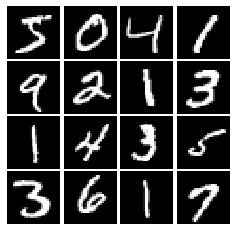

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [5]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    leaky_relu=tf.maximum(x,0)+alpha*(x-tf.maximum(x,0))
    
    pass
    
    return leaky_relu
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [6]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [7]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    noise=tf.random.uniform(shape=[batch_size,dim],minval=-1,maxval=1)
    pass
    
    return noise
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [8]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [9]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(256,input_shape=(784,),activation=leaky_relu),
        tf.keras.layers.Dense(256,activation=leaky_relu),
        tf.keras.layers.Dense(1)
        

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [10]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [11]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(1024,input_shape=(noise_dim,),activation='relu'),
        tf.keras.layers.Dense(1024,activation='relu'),
        tf.keras.layers.Dense(784,activation='tanh')

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [12]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [28]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    bi=tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss=bi(tf.ones_like(logits_real),logits_real)
    loss+=bi(tf.zeros_like(logits_fake),logits_fake)
    
    pass
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    bi=tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss=bi(tf.ones_like(logits_fake),logits_fake)
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [29]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [30]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [31]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    D_solver= tf.optimizers.Adam(learning_rate=learning_rate,beta_1=beta1)
    G_solver= tf.optimizers.Adam(learning_rate=learning_rate,beta_1=beta1)
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [14]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.859, G:0.7487
Instructions for updating:
Use tf.identity instead.


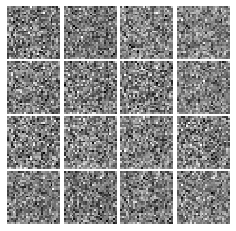

Epoch: 0, Iter: 20, D: 0.5661, G:0.9982


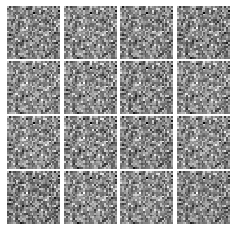

Epoch: 0, Iter: 40, D: 0.4484, G:1.097


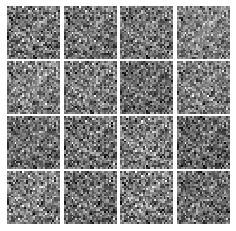

Epoch: 0, Iter: 60, D: 1.036, G:1.318


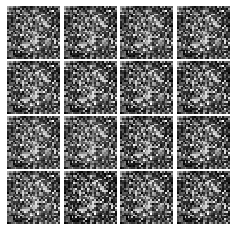

Epoch: 0, Iter: 80, D: 1.448, G:1.49


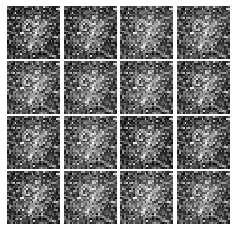

Epoch: 0, Iter: 100, D: 1.784, G:2.204


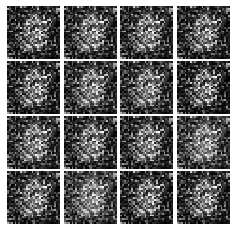

Epoch: 0, Iter: 120, D: 1.575, G:0.8681


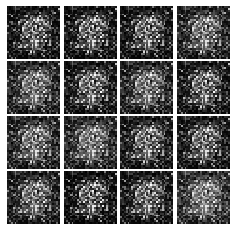

Epoch: 0, Iter: 140, D: 1.229, G:1.29


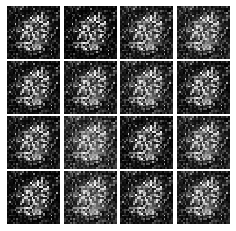

Epoch: 0, Iter: 160, D: 1.526, G:1.306


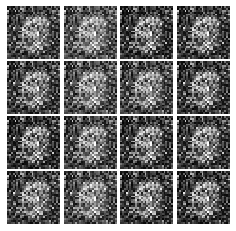

Epoch: 0, Iter: 180, D: 0.8733, G:1.509


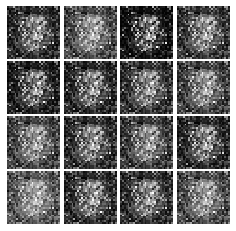

Epoch: 0, Iter: 200, D: 1.2, G:1.937


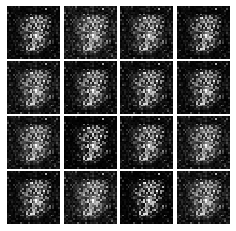

Epoch: 0, Iter: 220, D: 1.513, G:0.435


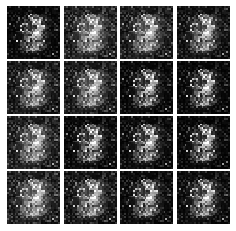

Epoch: 0, Iter: 240, D: 1.255, G:1.058


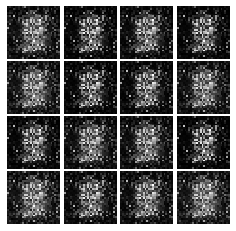

Epoch: 0, Iter: 260, D: 0.9869, G:1.681


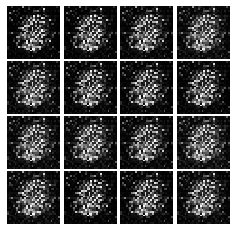

Epoch: 0, Iter: 280, D: 1.951, G:1.101


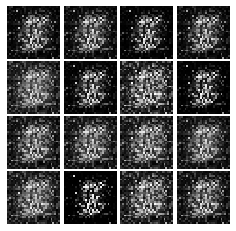

Epoch: 0, Iter: 300, D: 1.089, G:1.129


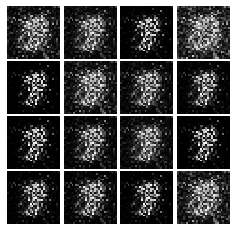

Epoch: 0, Iter: 320, D: 1.752, G:0.7817


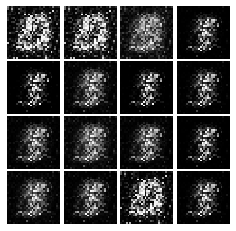

Epoch: 0, Iter: 340, D: 1.397, G:0.9499


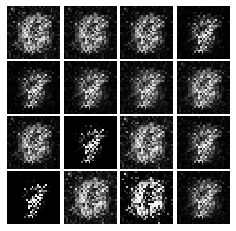

Epoch: 0, Iter: 360, D: 1.678, G:0.4639


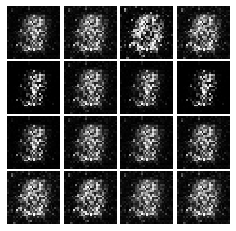

Epoch: 0, Iter: 380, D: 1.455, G:0.4295


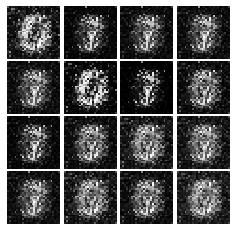

Epoch: 0, Iter: 400, D: 1.238, G:1.558


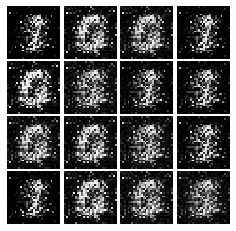

Epoch: 0, Iter: 420, D: 1.213, G:1.111


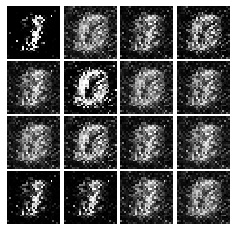

Epoch: 0, Iter: 440, D: 1.056, G:0.8871


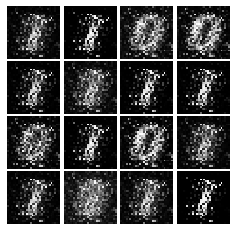

Epoch: 0, Iter: 460, D: 1.191, G:1.322


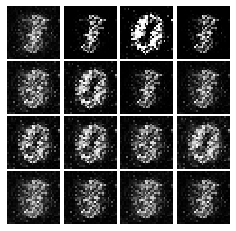

Epoch: 1, Iter: 480, D: 1.276, G:1.128


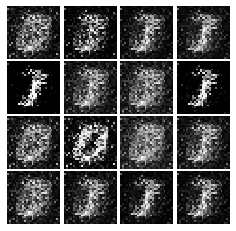

Epoch: 1, Iter: 500, D: 1.235, G:1.136


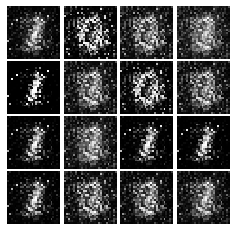

Epoch: 1, Iter: 520, D: 1.263, G:0.6851


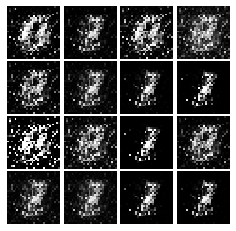

Epoch: 1, Iter: 540, D: 1.09, G:1.574


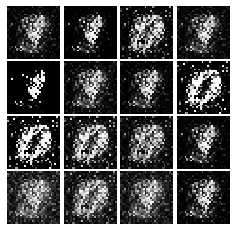

Epoch: 1, Iter: 560, D: 1.054, G:1.173


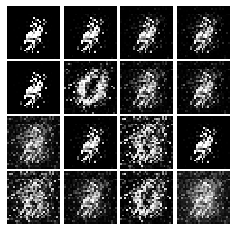

Epoch: 1, Iter: 580, D: 1.122, G:1.558


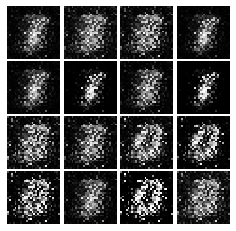

Epoch: 1, Iter: 600, D: 1.27, G:2.143


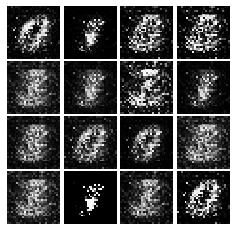

Epoch: 1, Iter: 620, D: 1.012, G:3.34


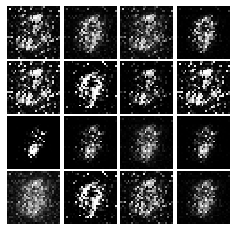

Epoch: 1, Iter: 640, D: 0.822, G:1.576


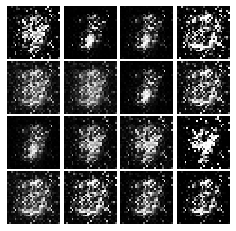

Epoch: 1, Iter: 660, D: 1.218, G:1.213


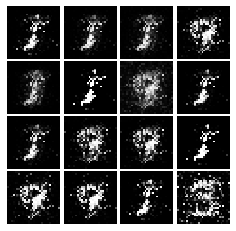

Epoch: 1, Iter: 680, D: 0.8558, G:2.846


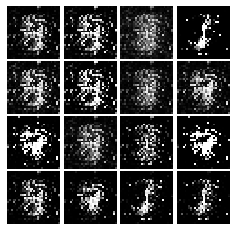

Epoch: 1, Iter: 700, D: 1.032, G:1.215


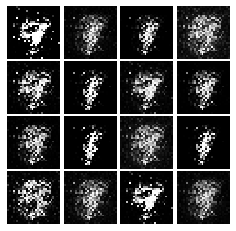

Epoch: 1, Iter: 720, D: 2.825, G:0.6741


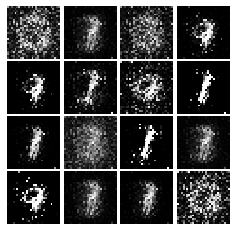

Epoch: 1, Iter: 740, D: 1.043, G:1.413


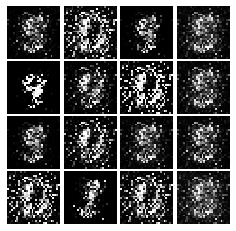

Epoch: 1, Iter: 760, D: 1.303, G:0.8672


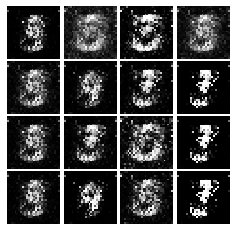

Epoch: 1, Iter: 780, D: 1.168, G:0.8416


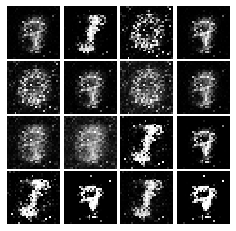

Epoch: 1, Iter: 800, D: 1.407, G:1.166


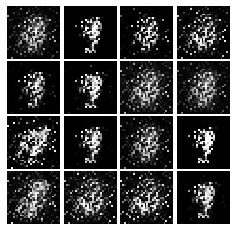

Epoch: 1, Iter: 820, D: 1.388, G:0.9807


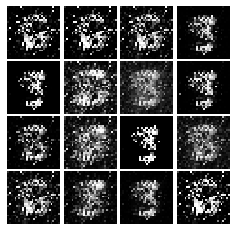

Epoch: 1, Iter: 840, D: 1.173, G:1.283


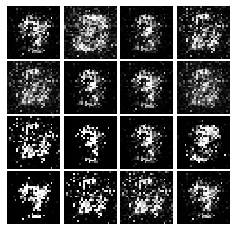

Epoch: 1, Iter: 860, D: 2.193, G:0.1619


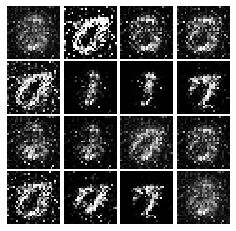

Epoch: 1, Iter: 880, D: 1.061, G:1.128


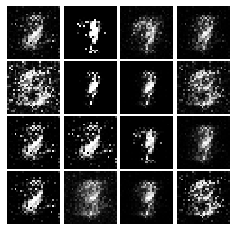

Epoch: 1, Iter: 900, D: 1.279, G:2.535


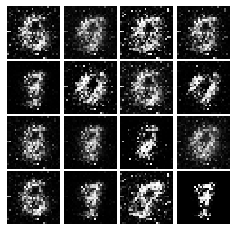

Epoch: 1, Iter: 920, D: 1.32, G:1.011


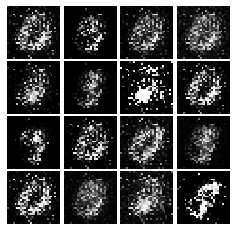

Epoch: 2, Iter: 940, D: 1.35, G:0.8715


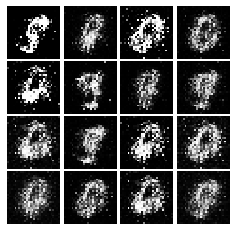

Epoch: 2, Iter: 960, D: 1.053, G:1.326


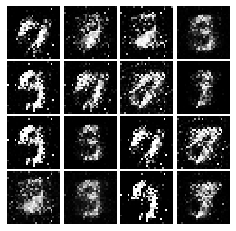

Epoch: 2, Iter: 980, D: 1.179, G:1.07


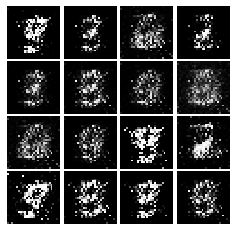

Epoch: 2, Iter: 1000, D: 1.328, G:1.166


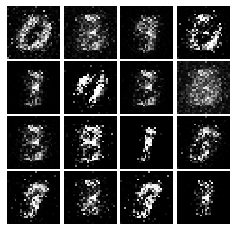

Epoch: 2, Iter: 1020, D: 1.3, G:3.034


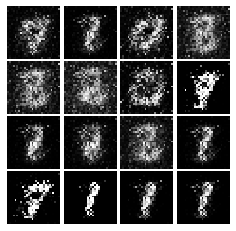

Epoch: 2, Iter: 1040, D: 1.346, G:1.007


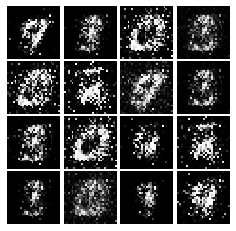

Epoch: 2, Iter: 1060, D: 1.193, G:0.8376


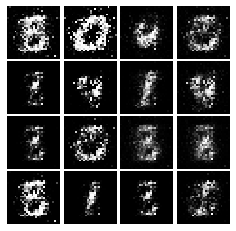

Epoch: 2, Iter: 1080, D: 1.249, G:0.9524


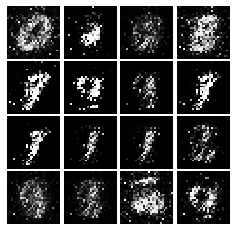

Epoch: 2, Iter: 1100, D: 1.327, G:0.9177


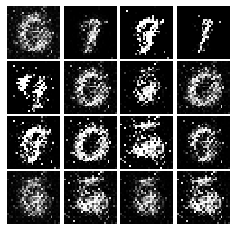

Epoch: 2, Iter: 1120, D: 1.111, G:1.145


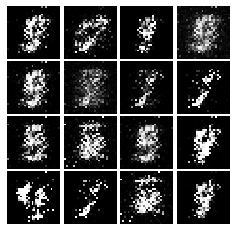

Epoch: 2, Iter: 1140, D: 1.319, G:1.017


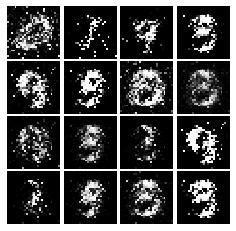

Epoch: 2, Iter: 1160, D: 1.456, G:0.9198


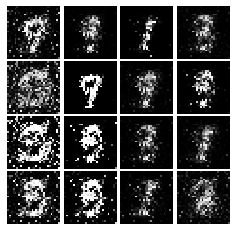

Epoch: 2, Iter: 1180, D: 2.025, G:0.671


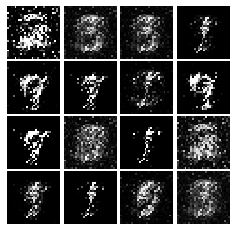

Epoch: 2, Iter: 1200, D: 1.284, G:0.9171


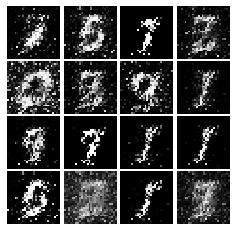

Epoch: 2, Iter: 1220, D: 1.262, G:1.067


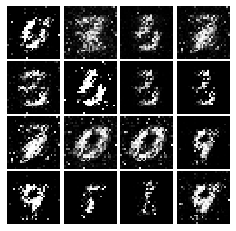

Epoch: 2, Iter: 1240, D: 1.17, G:1.206


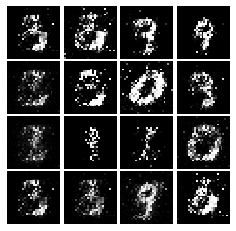

Epoch: 2, Iter: 1260, D: 1.182, G:1.763


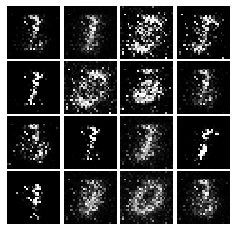

Epoch: 2, Iter: 1280, D: 1.422, G:0.9753


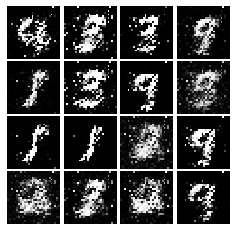

Epoch: 2, Iter: 1300, D: 1.068, G:1.502


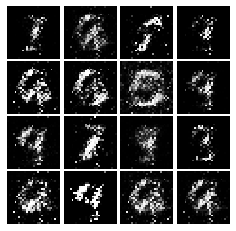

Epoch: 2, Iter: 1320, D: 1.386, G:0.9049


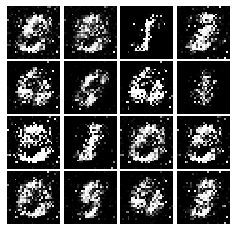

Epoch: 2, Iter: 1340, D: 1.356, G:1.75


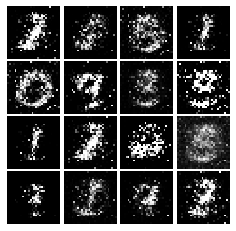

Epoch: 2, Iter: 1360, D: 1.114, G:1.228


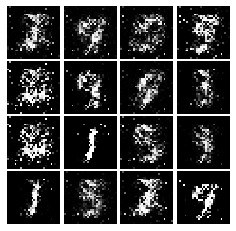

Epoch: 2, Iter: 1380, D: 1.106, G:1.54


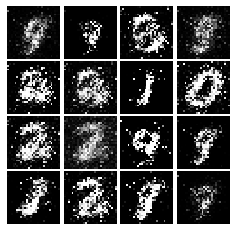

Epoch: 2, Iter: 1400, D: 1.394, G:0.9814


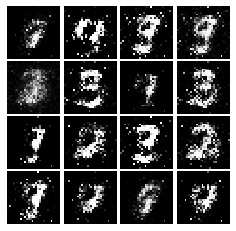

Epoch: 3, Iter: 1420, D: 1.247, G:1.023


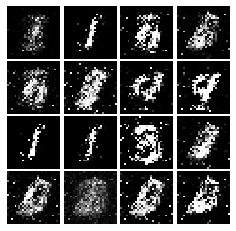

Epoch: 3, Iter: 1440, D: 1.223, G:1.014


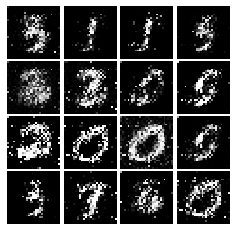

Epoch: 3, Iter: 1460, D: 1.343, G:0.9418


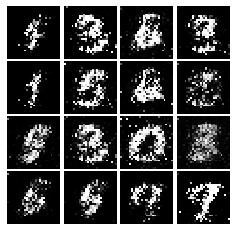

Epoch: 3, Iter: 1480, D: 1.189, G:1.187


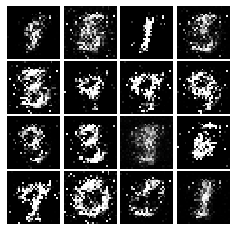

Epoch: 3, Iter: 1500, D: 1.173, G:1.164


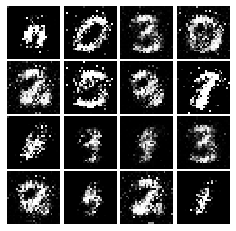

Epoch: 3, Iter: 1520, D: 1.248, G:0.9482


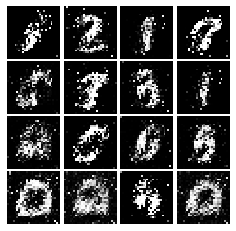

Epoch: 3, Iter: 1540, D: 1.269, G:0.9098


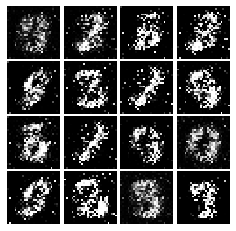

Epoch: 3, Iter: 1560, D: 1.339, G:1.906


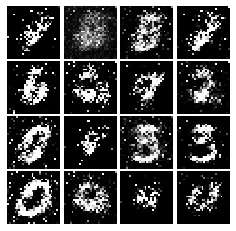

Epoch: 3, Iter: 1580, D: 1.475, G:1.116


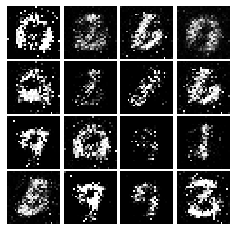

Epoch: 3, Iter: 1600, D: 1.09, G:1.103


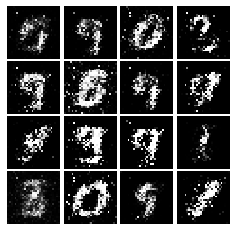

Epoch: 3, Iter: 1620, D: 1.218, G:0.9245


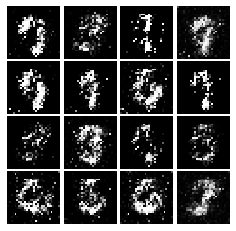

Epoch: 3, Iter: 1640, D: 1.203, G:0.8676


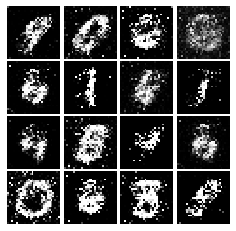

Epoch: 3, Iter: 1660, D: 1.313, G:0.9638


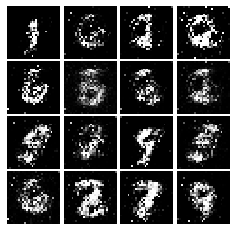

Epoch: 3, Iter: 1680, D: 1.27, G:1.205


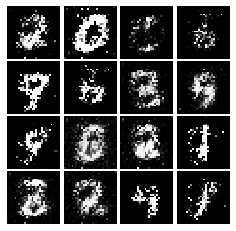

Epoch: 3, Iter: 1700, D: 1.31, G:0.931


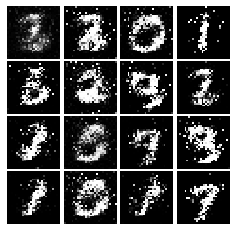

Epoch: 3, Iter: 1720, D: 1.304, G:1.03


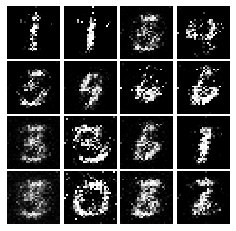

Epoch: 3, Iter: 1740, D: 1.153, G:1.151


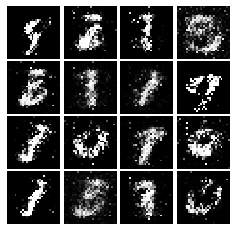

Epoch: 3, Iter: 1760, D: 1.142, G:0.9472


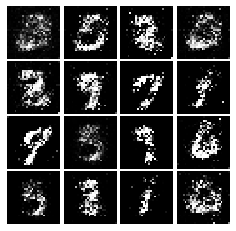

Epoch: 3, Iter: 1780, D: 1.143, G:0.9274


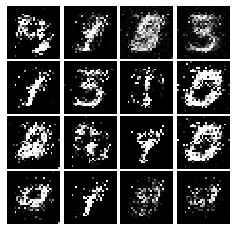

Epoch: 3, Iter: 1800, D: 1.253, G:0.8871


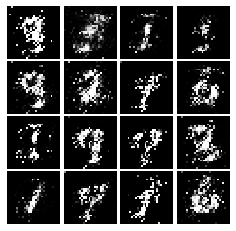

Epoch: 3, Iter: 1820, D: 1.292, G:0.8019


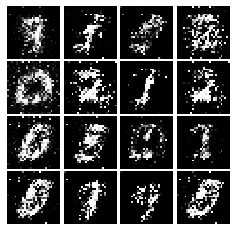

Epoch: 3, Iter: 1840, D: 1.307, G:0.8785


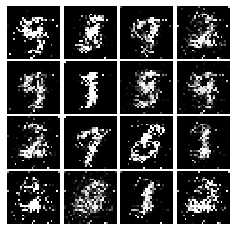

Epoch: 3, Iter: 1860, D: 1.284, G:0.9312


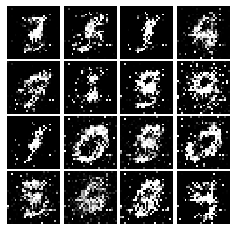

Epoch: 4, Iter: 1880, D: 1.166, G:1.605


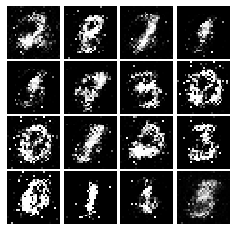

Epoch: 4, Iter: 1900, D: 1.298, G:0.8879


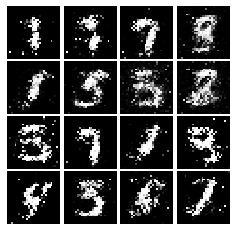

Epoch: 4, Iter: 1920, D: 1.381, G:0.8391


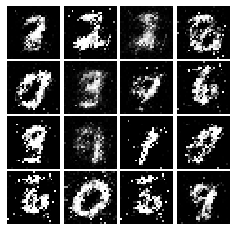

Epoch: 4, Iter: 1940, D: 1.176, G:1.012


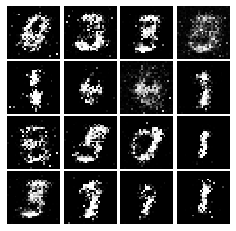

Epoch: 4, Iter: 1960, D: 1.328, G:0.9495


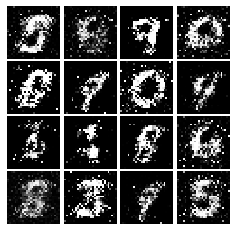

Epoch: 4, Iter: 1980, D: 1.286, G:0.9625


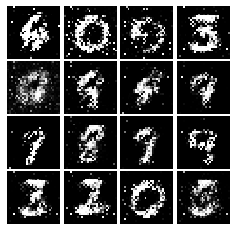

Epoch: 4, Iter: 2000, D: 1.285, G:0.8835


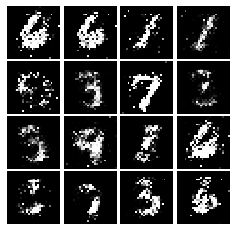

Epoch: 4, Iter: 2020, D: 1.269, G:0.8692


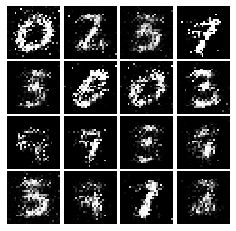

Epoch: 4, Iter: 2040, D: 1.251, G:0.8494


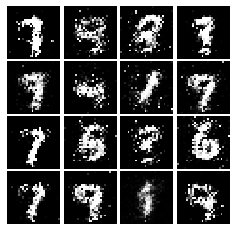

Epoch: 4, Iter: 2060, D: 1.491, G:1.017


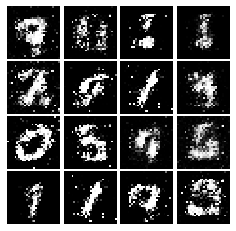

Epoch: 4, Iter: 2080, D: 1.266, G:0.908


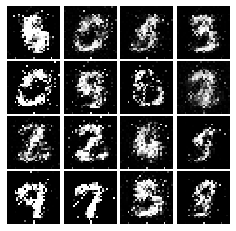

Epoch: 4, Iter: 2100, D: 1.185, G:0.8129


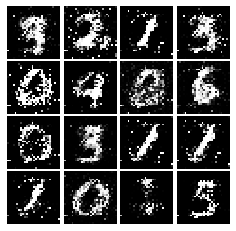

Epoch: 4, Iter: 2120, D: 1.329, G:0.8059


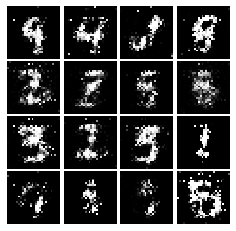

Epoch: 4, Iter: 2140, D: 1.29, G:0.8892


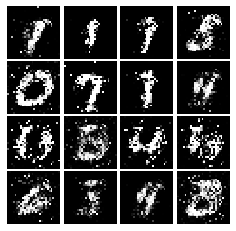

Epoch: 4, Iter: 2160, D: 1.361, G:0.7569


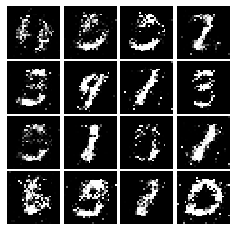

Epoch: 4, Iter: 2180, D: 1.335, G:0.9147


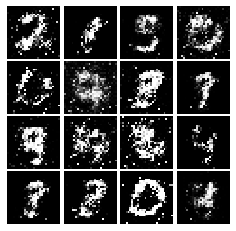

Epoch: 4, Iter: 2200, D: 1.386, G:0.7712


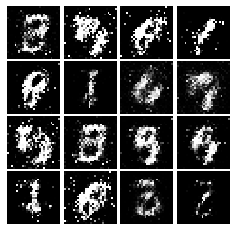

Epoch: 4, Iter: 2220, D: 1.245, G:0.8341


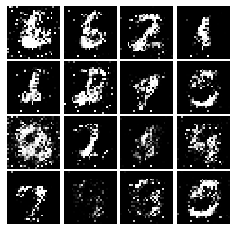

Epoch: 4, Iter: 2240, D: 1.274, G:0.9017


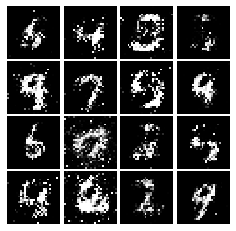

Epoch: 4, Iter: 2260, D: 1.265, G:0.7348


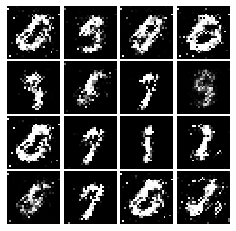

Epoch: 4, Iter: 2280, D: 1.218, G:1.076


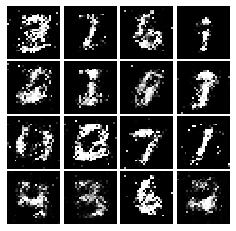

Epoch: 4, Iter: 2300, D: 1.322, G:0.8621


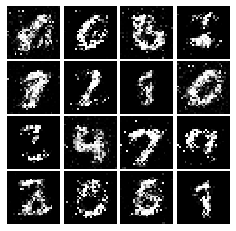

Epoch: 4, Iter: 2320, D: 1.277, G:1.197


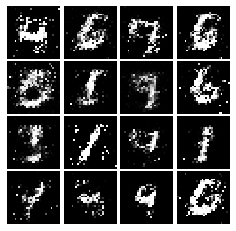

Epoch: 4, Iter: 2340, D: 1.194, G:1.114


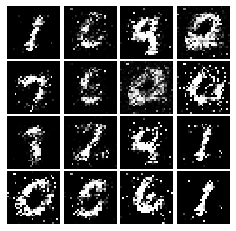

Epoch: 5, Iter: 2360, D: 1.274, G:0.8189


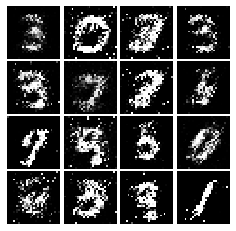

Epoch: 5, Iter: 2380, D: 1.224, G:0.955


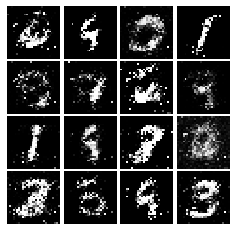

Epoch: 5, Iter: 2400, D: 1.289, G:0.9388


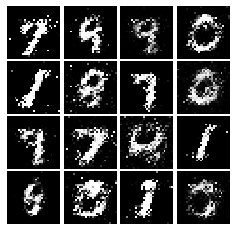

Epoch: 5, Iter: 2420, D: 1.257, G:0.9126


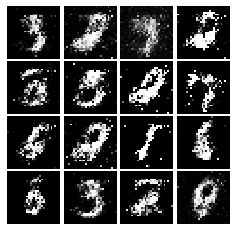

Epoch: 5, Iter: 2440, D: 1.354, G:0.8934


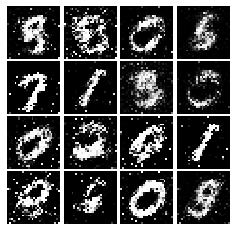

Epoch: 5, Iter: 2460, D: 1.24, G:0.862


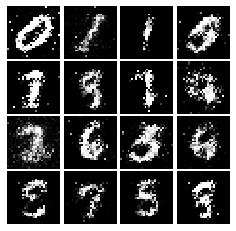

Epoch: 5, Iter: 2480, D: 1.226, G:0.9112


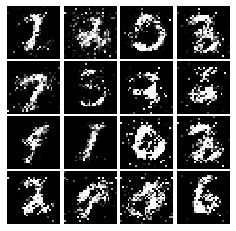

Epoch: 5, Iter: 2500, D: 1.348, G:0.8586


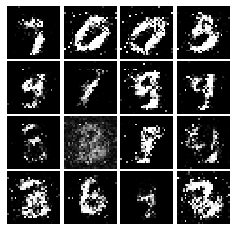

Epoch: 5, Iter: 2520, D: 1.428, G:0.7852


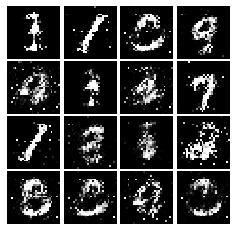

Epoch: 5, Iter: 2540, D: 1.356, G:0.8907


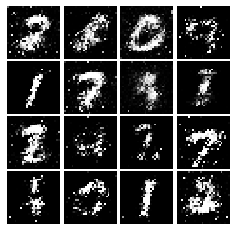

Epoch: 5, Iter: 2560, D: 1.304, G:0.9309


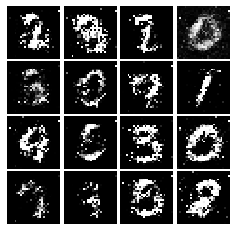

Epoch: 5, Iter: 2580, D: 1.226, G:0.8486


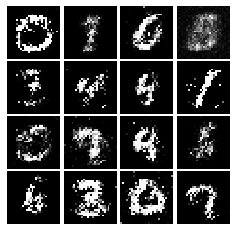

Epoch: 5, Iter: 2600, D: 1.535, G:0.7246


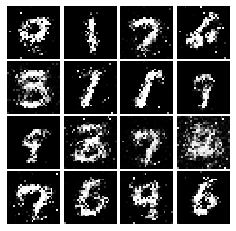

Epoch: 5, Iter: 2620, D: 1.356, G:1.004


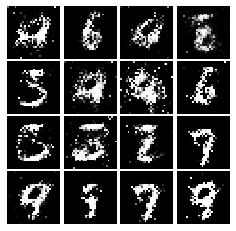

Epoch: 5, Iter: 2640, D: 1.212, G:1.056


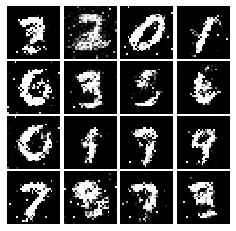

Epoch: 5, Iter: 2660, D: 1.303, G:0.9226


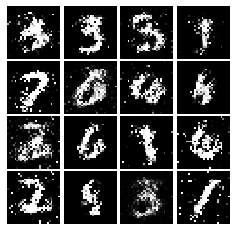

Epoch: 5, Iter: 2680, D: 1.309, G:0.8263


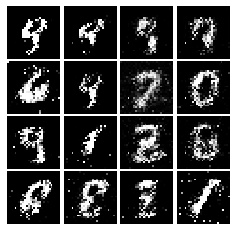

Epoch: 5, Iter: 2700, D: 1.332, G:0.7766


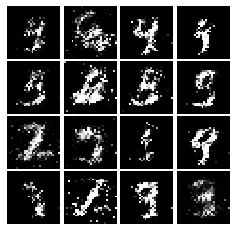

Epoch: 5, Iter: 2720, D: 1.314, G:0.9427


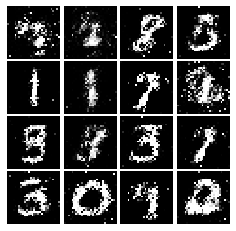

Epoch: 5, Iter: 2740, D: 1.272, G:0.9711


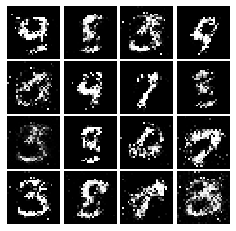

Epoch: 5, Iter: 2760, D: 1.392, G:1.273


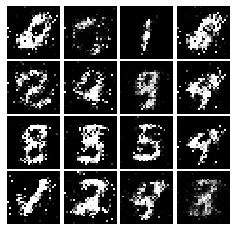

Epoch: 5, Iter: 2780, D: 1.271, G:0.8466


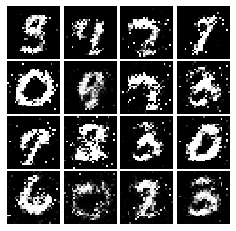

Epoch: 5, Iter: 2800, D: 1.288, G:0.8117


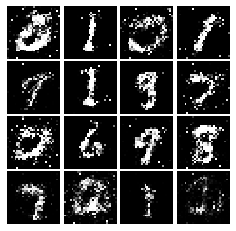

Epoch: 6, Iter: 2820, D: 1.225, G:0.8651


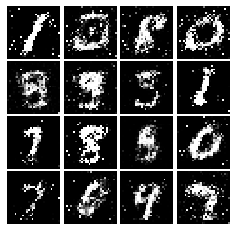

Epoch: 6, Iter: 2840, D: 1.296, G:1.221


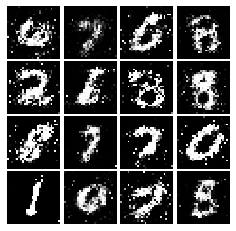

Epoch: 6, Iter: 2860, D: 1.258, G:0.7756


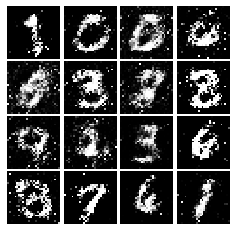

Epoch: 6, Iter: 2880, D: 1.294, G:0.925


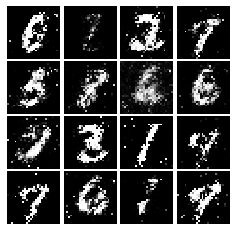

Epoch: 6, Iter: 2900, D: 1.248, G:0.7747


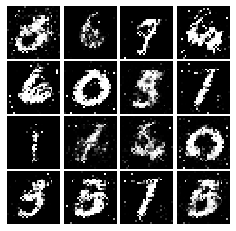

Epoch: 6, Iter: 2920, D: 1.234, G:1.338


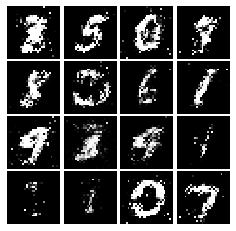

Epoch: 6, Iter: 2940, D: 1.267, G:0.7657


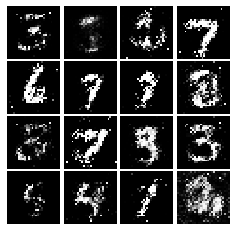

Epoch: 6, Iter: 2960, D: 1.383, G:0.7581


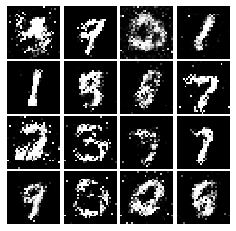

Epoch: 6, Iter: 2980, D: 1.362, G:0.9449


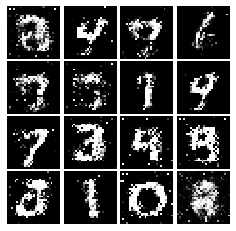

Epoch: 6, Iter: 3000, D: 1.184, G:0.841


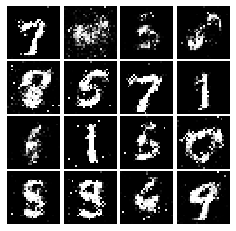

Epoch: 6, Iter: 3020, D: 1.317, G:0.7999


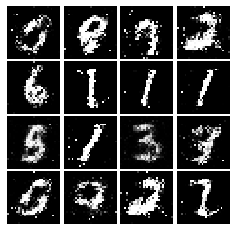

Epoch: 6, Iter: 3040, D: 1.378, G:0.8644


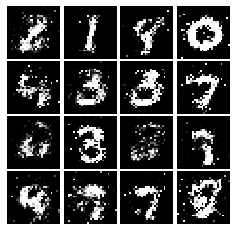

Epoch: 6, Iter: 3060, D: 1.351, G:0.8248


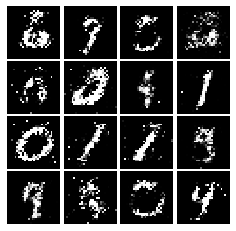

Epoch: 6, Iter: 3080, D: 1.321, G:0.8333


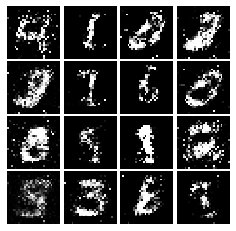

Epoch: 6, Iter: 3100, D: 1.234, G:0.818


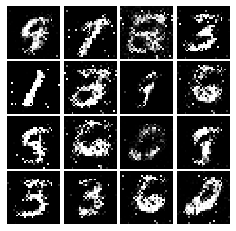

Epoch: 6, Iter: 3120, D: 1.281, G:0.7548


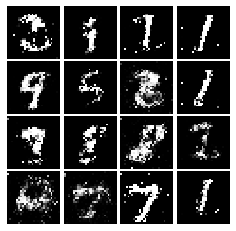

Epoch: 6, Iter: 3140, D: 1.316, G:0.7788


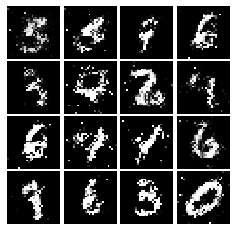

Epoch: 6, Iter: 3160, D: 1.223, G:0.8634


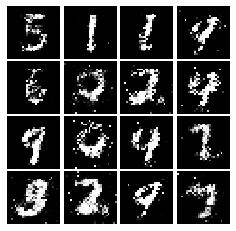

Epoch: 6, Iter: 3180, D: 1.272, G:0.8057


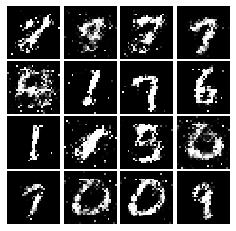

Epoch: 6, Iter: 3200, D: 1.268, G:0.8035


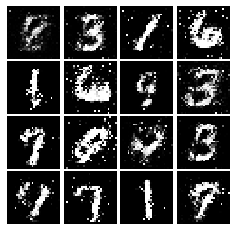

Epoch: 6, Iter: 3220, D: 1.311, G:0.9192


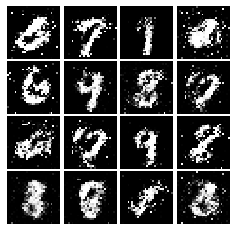

Epoch: 6, Iter: 3240, D: 1.255, G:0.8059


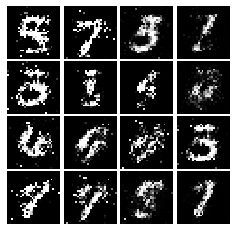

Epoch: 6, Iter: 3260, D: 1.339, G:0.9118


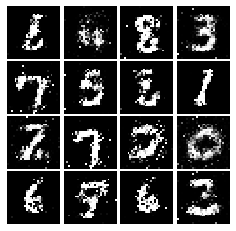

Epoch: 6, Iter: 3280, D: 1.323, G:0.9232


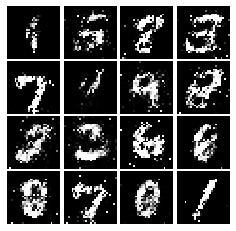

Epoch: 7, Iter: 3300, D: 1.23, G:1.041


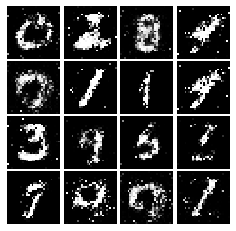

Epoch: 7, Iter: 3320, D: 1.33, G:0.9365


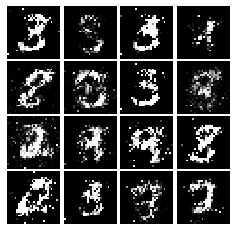

Epoch: 7, Iter: 3340, D: 1.238, G:0.8259


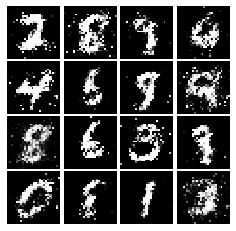

Epoch: 7, Iter: 3360, D: 1.324, G:0.8647


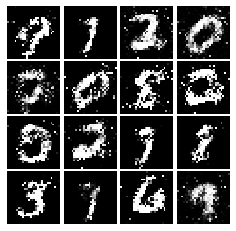

Epoch: 7, Iter: 3380, D: 1.218, G:0.9617


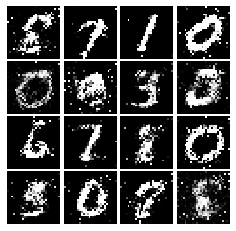

Epoch: 7, Iter: 3400, D: 1.324, G:0.9247


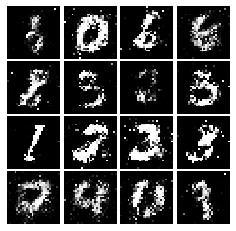

Epoch: 7, Iter: 3420, D: 1.321, G:0.8094


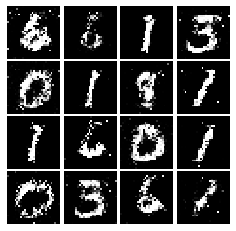

Epoch: 7, Iter: 3440, D: 1.279, G:0.847


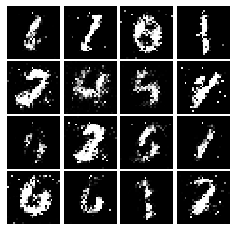

Epoch: 7, Iter: 3460, D: 1.271, G:0.9188


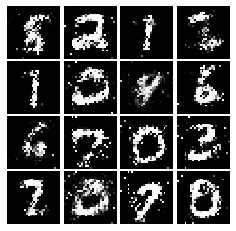

Epoch: 7, Iter: 3480, D: 1.361, G:0.7702


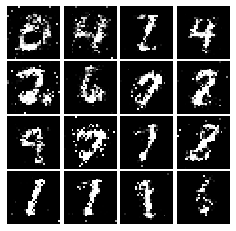

Epoch: 7, Iter: 3500, D: 1.387, G:0.8275


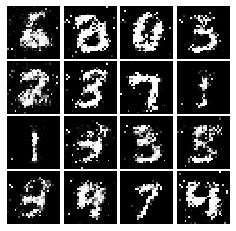

Epoch: 7, Iter: 3520, D: 1.319, G:0.7267


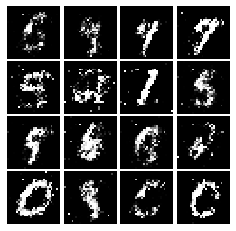

Epoch: 7, Iter: 3540, D: 1.266, G:0.7931


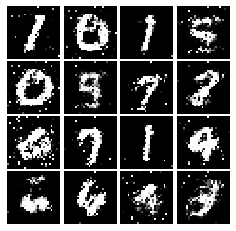

Epoch: 7, Iter: 3560, D: 1.299, G:0.7867


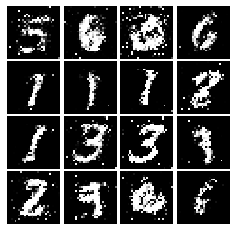

Epoch: 7, Iter: 3580, D: 1.294, G:0.8515


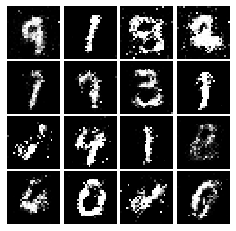

Epoch: 7, Iter: 3600, D: 1.355, G:0.7329


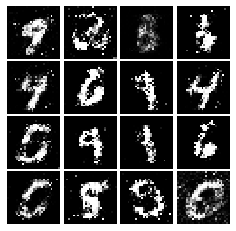

Epoch: 7, Iter: 3620, D: 1.317, G:0.8809


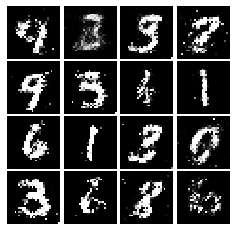

Epoch: 7, Iter: 3640, D: 1.362, G:0.8688


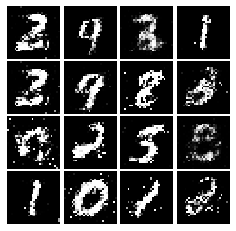

Epoch: 7, Iter: 3660, D: 1.301, G:0.8395


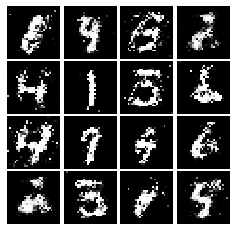

Epoch: 7, Iter: 3680, D: 1.291, G:0.8417


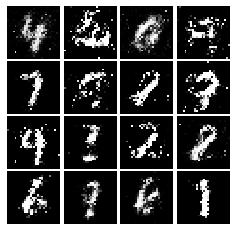

Epoch: 7, Iter: 3700, D: 1.394, G:0.869


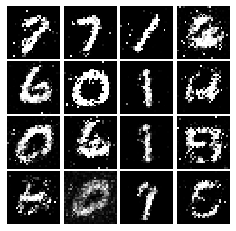

Epoch: 7, Iter: 3720, D: 1.294, G:0.9438


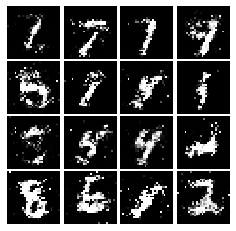

Epoch: 7, Iter: 3740, D: 1.461, G:0.7536


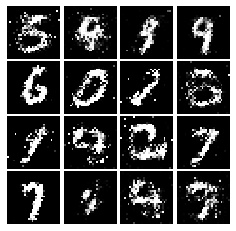

Epoch: 8, Iter: 3760, D: 1.323, G:0.896


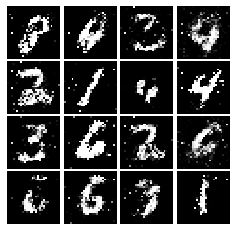

Epoch: 8, Iter: 3780, D: 1.369, G:0.7885


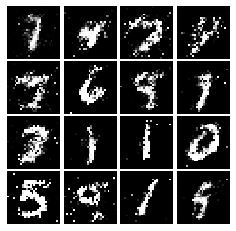

Epoch: 8, Iter: 3800, D: 1.231, G:0.769


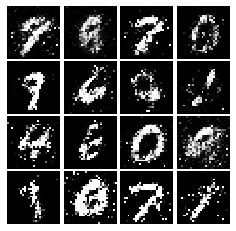

Epoch: 8, Iter: 3820, D: 1.289, G:0.8192


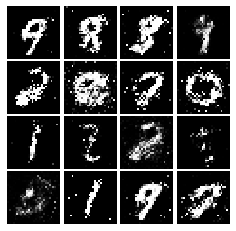

Epoch: 8, Iter: 3840, D: 1.356, G:0.7512


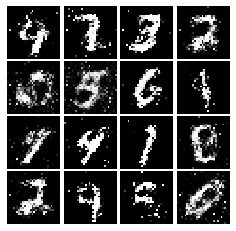

Epoch: 8, Iter: 3860, D: 1.307, G:0.7826


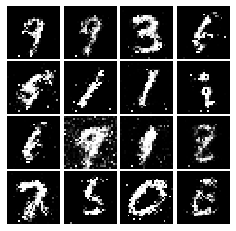

Epoch: 8, Iter: 3880, D: 1.326, G:0.7908


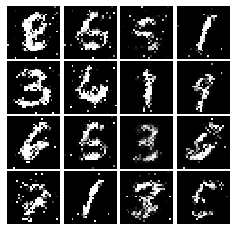

Epoch: 8, Iter: 3900, D: 1.335, G:0.9036


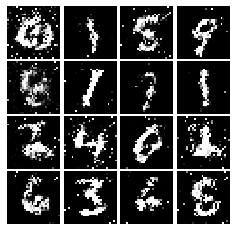

Epoch: 8, Iter: 3920, D: 1.3, G:0.7545


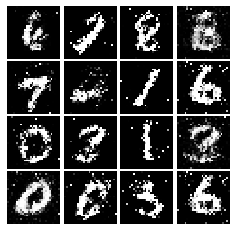

Epoch: 8, Iter: 3940, D: 1.423, G:0.7938


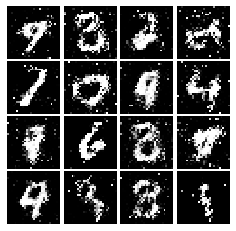

Epoch: 8, Iter: 3960, D: 1.307, G:0.9103


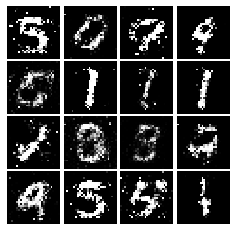

Epoch: 8, Iter: 3980, D: 1.342, G:0.7671


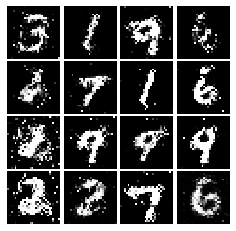

Epoch: 8, Iter: 4000, D: 1.24, G:0.8436


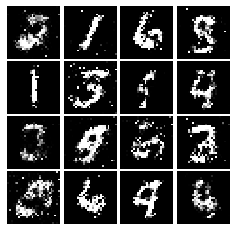

Epoch: 8, Iter: 4020, D: 1.351, G:0.7688


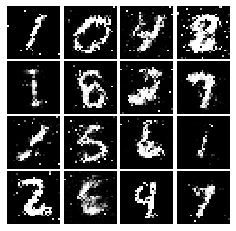

Epoch: 8, Iter: 4040, D: 1.326, G:0.7306


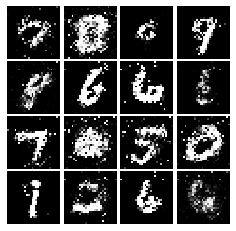

Epoch: 8, Iter: 4060, D: 1.268, G:0.9982


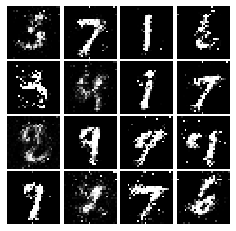

Epoch: 8, Iter: 4080, D: 1.398, G:0.6923


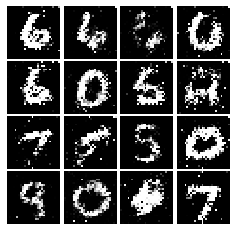

Epoch: 8, Iter: 4100, D: 1.292, G:0.7912


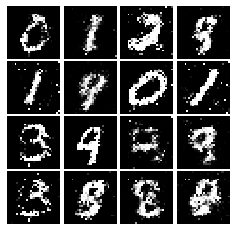

Epoch: 8, Iter: 4120, D: 1.301, G:0.7289


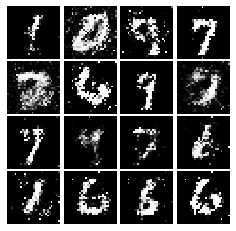

Epoch: 8, Iter: 4140, D: 1.337, G:0.8773


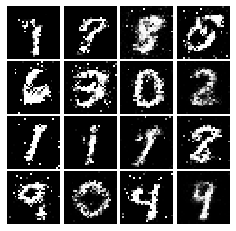

Epoch: 8, Iter: 4160, D: 1.297, G:0.8449


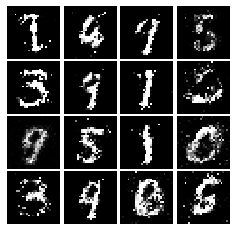

Epoch: 8, Iter: 4180, D: 1.353, G:0.7126


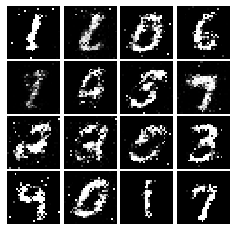

Epoch: 8, Iter: 4200, D: 1.379, G:0.8247


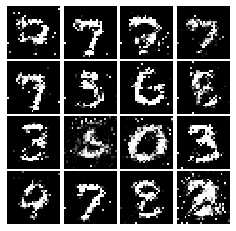

Epoch: 8, Iter: 4220, D: 1.295, G:0.7564


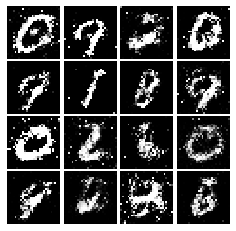

Epoch: 9, Iter: 4240, D: 1.371, G:1.032


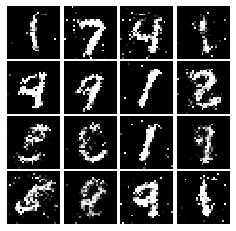

Epoch: 9, Iter: 4260, D: 1.424, G:0.7858


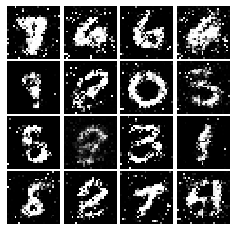

Epoch: 9, Iter: 4280, D: 1.386, G:0.8884


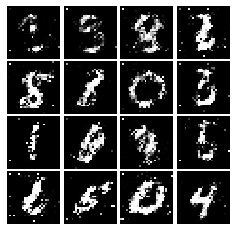

Epoch: 9, Iter: 4300, D: 1.417, G:0.8002


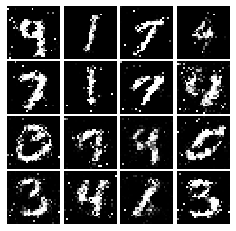

Epoch: 9, Iter: 4320, D: 1.382, G:0.8994


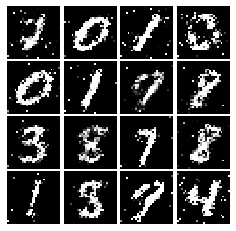

Epoch: 9, Iter: 4340, D: 1.338, G:0.9836


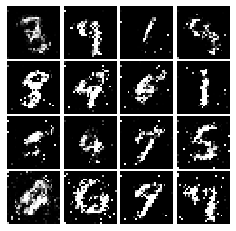

Epoch: 9, Iter: 4360, D: 1.406, G:0.8596


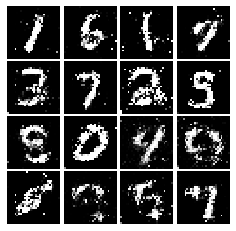

Epoch: 9, Iter: 4380, D: 1.458, G:0.823


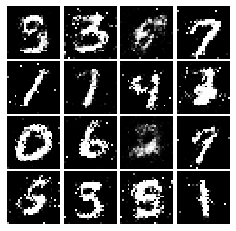

Epoch: 9, Iter: 4400, D: 1.274, G:0.794


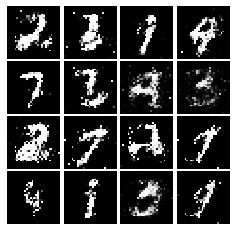

Epoch: 9, Iter: 4420, D: 1.314, G:0.7472


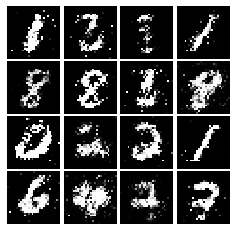

Epoch: 9, Iter: 4440, D: 1.334, G:0.8192


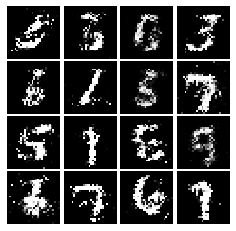

Epoch: 9, Iter: 4460, D: 1.326, G:0.7814


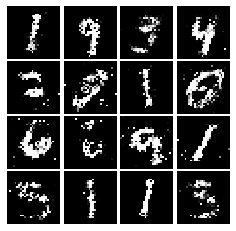

Epoch: 9, Iter: 4480, D: 1.337, G:0.7386


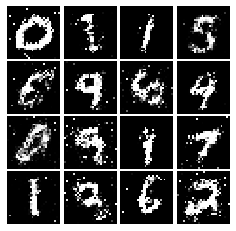

Epoch: 9, Iter: 4500, D: 1.442, G:0.8401


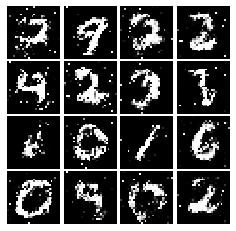

Epoch: 9, Iter: 4520, D: 1.337, G:0.7767


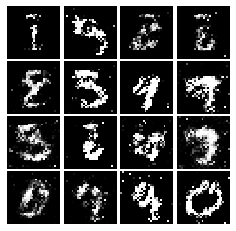

Epoch: 9, Iter: 4540, D: 1.286, G:0.7877


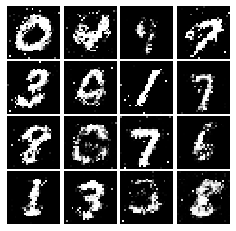

Epoch: 9, Iter: 4560, D: 1.338, G:0.7261


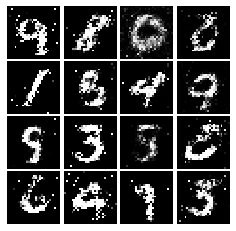

Epoch: 9, Iter: 4580, D: 1.394, G:0.7528


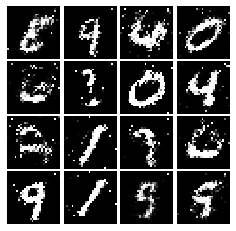

Epoch: 9, Iter: 4600, D: 1.323, G:0.8042


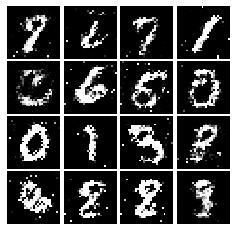

Epoch: 9, Iter: 4620, D: 1.35, G:0.9445


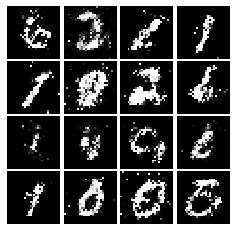

Epoch: 9, Iter: 4640, D: 1.363, G:0.7811


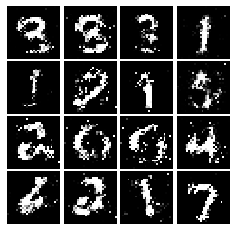

Epoch: 9, Iter: 4660, D: 1.372, G:0.7656


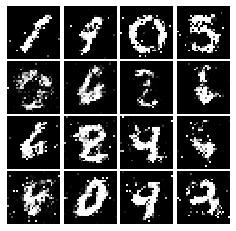

Epoch: 9, Iter: 4680, D: 1.311, G:0.7745


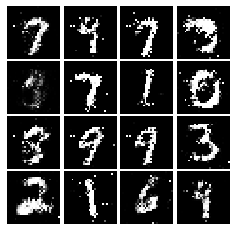

Final images


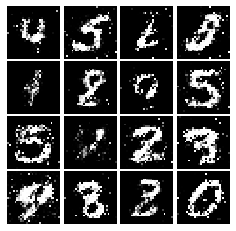

In [24]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [17]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss=tf.reduce_mean((scores_real-1)**2)+tf.reduce_mean(scores_fake**2)
    loss=loss/2
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss=tf.reduce_mean((scores_fake-1)**2)
    loss=loss/2
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [18]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.5132, G:0.4033
Instructions for updating:
Use tf.identity instead.


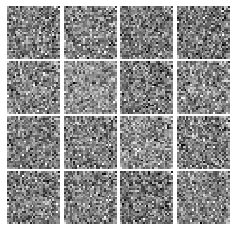

Epoch: 0, Iter: 20, D: 0.1651, G:2.375


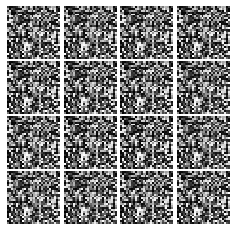

Epoch: 0, Iter: 40, D: 0.02903, G:0.8083


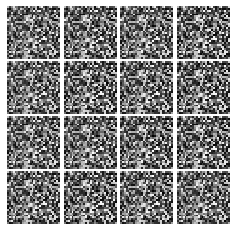

Epoch: 0, Iter: 60, D: 0.01309, G:0.7352


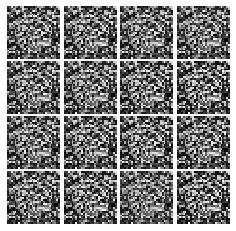

Epoch: 0, Iter: 80, D: 0.01774, G:0.5804


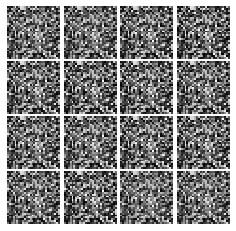

Epoch: 0, Iter: 100, D: 0.01523, G:0.5673


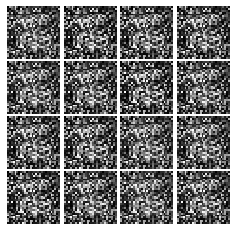

Epoch: 0, Iter: 120, D: 0.01129, G:0.6777


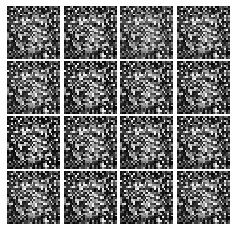

Epoch: 0, Iter: 140, D: 0.0257, G:0.6109


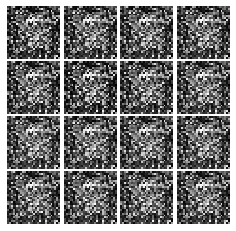

Epoch: 0, Iter: 160, D: 0.08354, G:0.9887


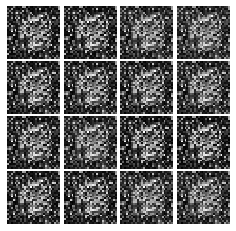

Epoch: 0, Iter: 180, D: 0.4554, G:1.077


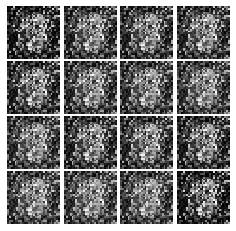

Epoch: 0, Iter: 200, D: 0.0767, G:0.5238


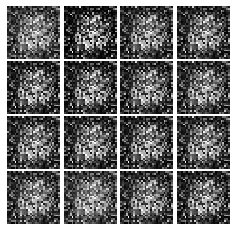

Epoch: 0, Iter: 220, D: 0.1319, G:0.3205


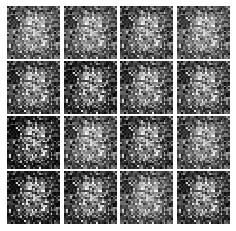

Epoch: 0, Iter: 240, D: 0.08311, G:0.6139


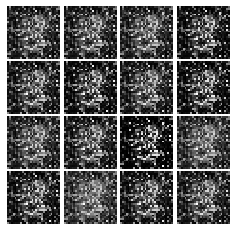

Epoch: 0, Iter: 260, D: 0.1625, G:0.1607


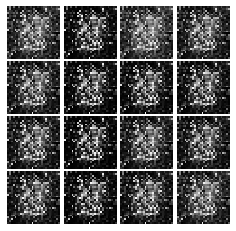

Epoch: 0, Iter: 280, D: 0.08564, G:0.6756


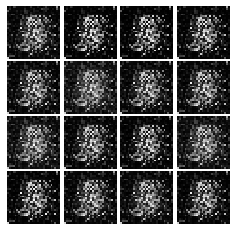

Epoch: 0, Iter: 300, D: 0.2207, G:0.4482


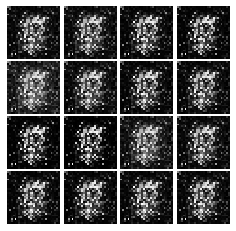

Epoch: 0, Iter: 320, D: 0.2103, G:0.2189


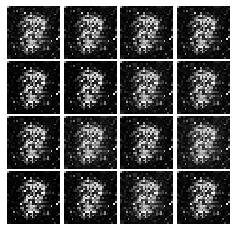

Epoch: 0, Iter: 340, D: 0.8295, G:0.06444


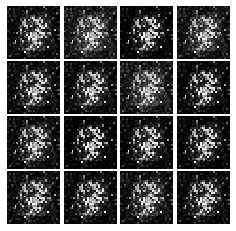

Epoch: 0, Iter: 360, D: 0.1632, G:0.3576


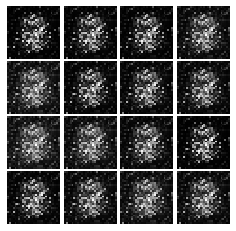

Epoch: 0, Iter: 380, D: 0.1104, G:0.782


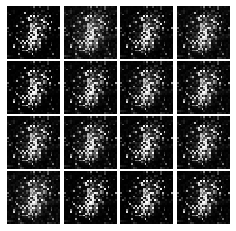

Epoch: 0, Iter: 400, D: 0.06578, G:0.442


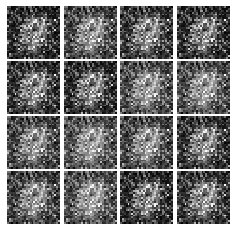

Epoch: 0, Iter: 420, D: 0.1373, G:0.34


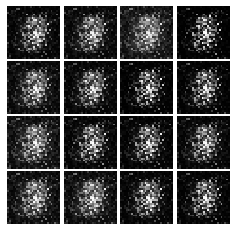

Epoch: 0, Iter: 440, D: 0.1209, G:0.3978


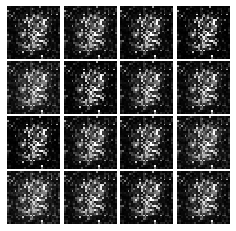

Epoch: 0, Iter: 460, D: 0.06608, G:0.4757


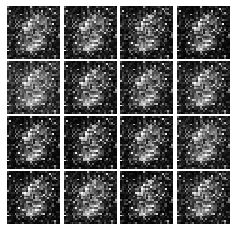

Epoch: 1, Iter: 480, D: 0.7129, G:0.03544


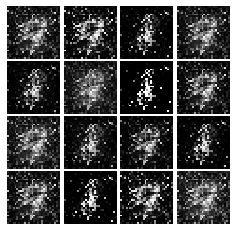

Epoch: 1, Iter: 500, D: 0.1714, G:0.4874


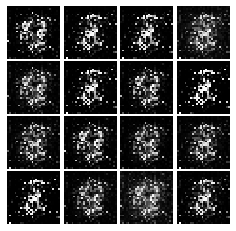

Epoch: 1, Iter: 520, D: 0.1109, G:0.707


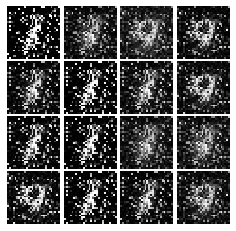

Epoch: 1, Iter: 540, D: 0.1606, G:0.3877


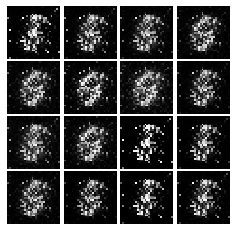

Epoch: 1, Iter: 560, D: 0.1257, G:0.3457


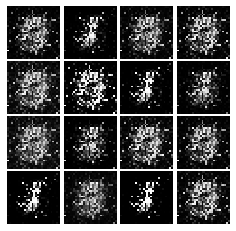

Epoch: 1, Iter: 580, D: 0.09779, G:0.7979


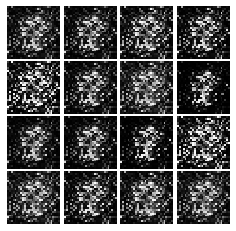

Epoch: 1, Iter: 600, D: 0.1209, G:0.5351


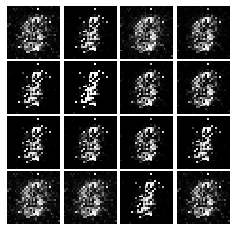

Epoch: 1, Iter: 620, D: 0.09933, G:0.4826


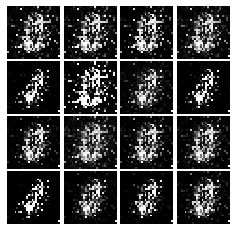

Epoch: 1, Iter: 640, D: 0.1814, G:0.3147


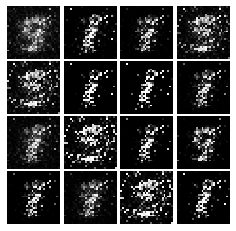

Epoch: 1, Iter: 660, D: 0.09529, G:0.3593


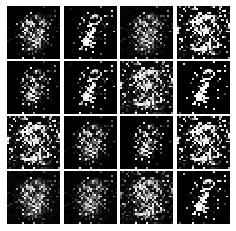

Epoch: 1, Iter: 680, D: 0.5597, G:0.0494


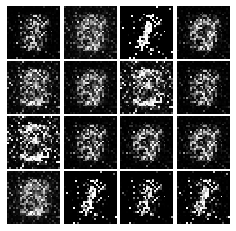

Epoch: 1, Iter: 700, D: 0.1752, G:0.4758


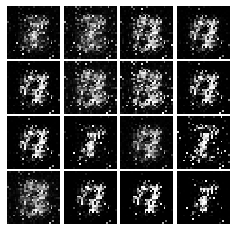

Epoch: 1, Iter: 720, D: 0.1249, G:0.2704


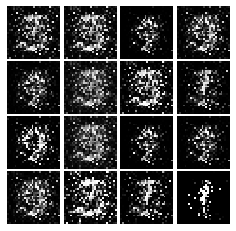

Epoch: 1, Iter: 740, D: 0.1145, G:0.3231


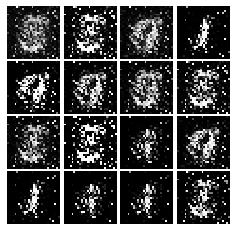

Epoch: 1, Iter: 760, D: 0.2674, G:0.146


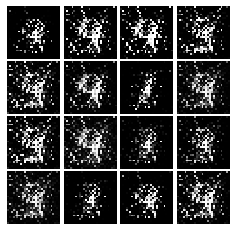

Epoch: 1, Iter: 780, D: 0.3002, G:0.07819


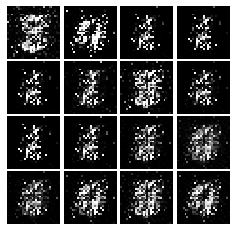

Epoch: 1, Iter: 800, D: 0.1252, G:0.2633


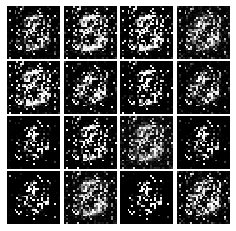

Epoch: 1, Iter: 820, D: 0.1385, G:0.2594


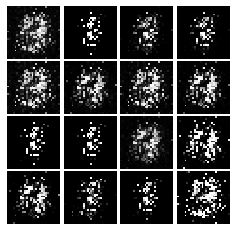

Epoch: 1, Iter: 840, D: 0.1068, G:0.4244


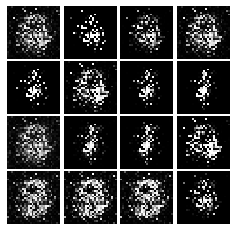

Epoch: 1, Iter: 860, D: 0.262, G:0.1709


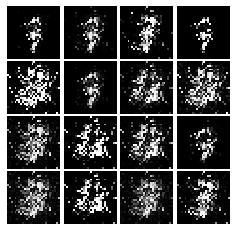

Epoch: 1, Iter: 880, D: 0.1573, G:0.2803


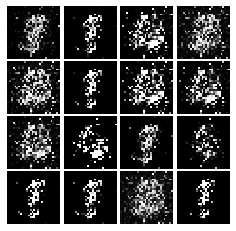

Epoch: 1, Iter: 900, D: 0.125, G:0.3107


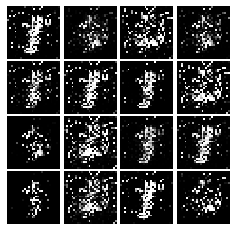

Epoch: 1, Iter: 920, D: 0.1139, G:0.3745


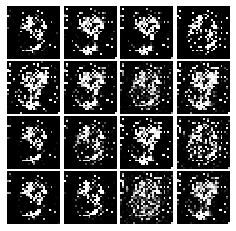

Epoch: 2, Iter: 940, D: 0.1016, G:0.327


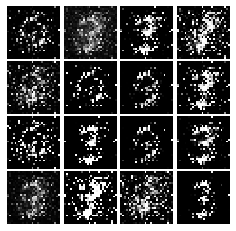

Epoch: 2, Iter: 960, D: 0.1691, G:0.2702


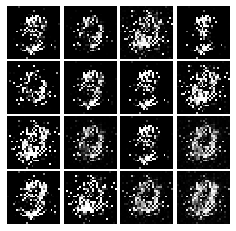

Epoch: 2, Iter: 980, D: 0.1255, G:0.2907


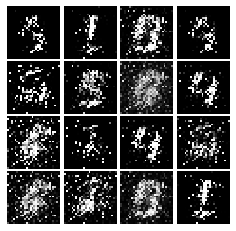

Epoch: 2, Iter: 1000, D: 0.1544, G:0.3527


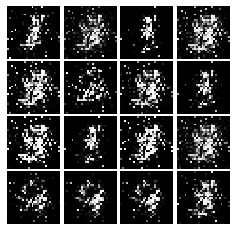

Epoch: 2, Iter: 1020, D: 0.1504, G:0.3763


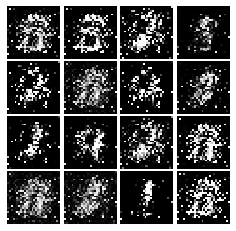

Epoch: 2, Iter: 1040, D: 0.1968, G:0.7687


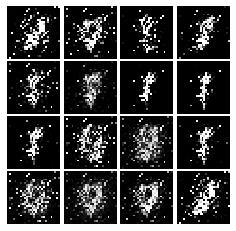

Epoch: 2, Iter: 1060, D: 0.122, G:0.4292


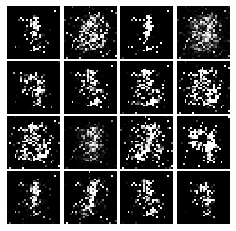

Epoch: 2, Iter: 1080, D: 0.1487, G:0.4213


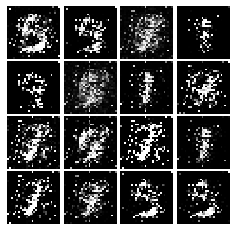

Epoch: 2, Iter: 1100, D: 0.1216, G:0.7746


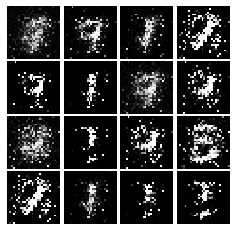

Epoch: 2, Iter: 1120, D: 0.1392, G:0.2497


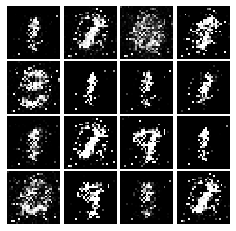

Epoch: 2, Iter: 1140, D: 0.2603, G:0.2944


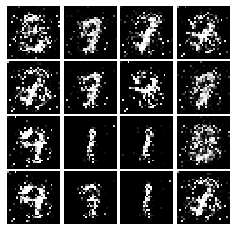

Epoch: 2, Iter: 1160, D: 0.1267, G:0.311


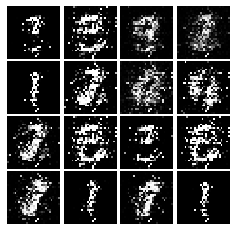

Epoch: 2, Iter: 1180, D: 0.1322, G:0.4035


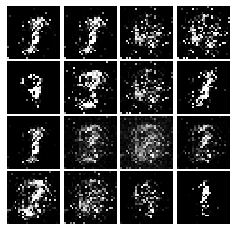

Epoch: 2, Iter: 1200, D: 0.1609, G:0.3598


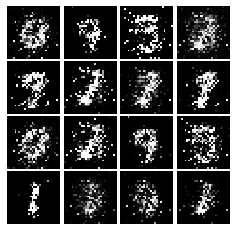

Epoch: 2, Iter: 1220, D: 0.226, G:0.3643


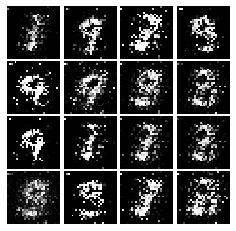

Epoch: 2, Iter: 1240, D: 0.1216, G:0.2863


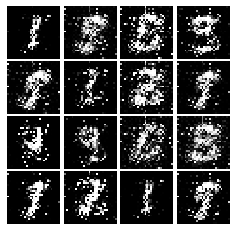

Epoch: 2, Iter: 1260, D: 0.1423, G:0.4976


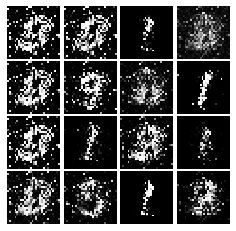

Epoch: 2, Iter: 1280, D: 0.2151, G:0.2673


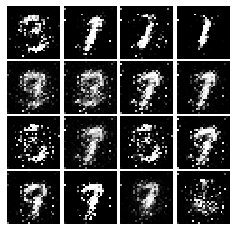

Epoch: 2, Iter: 1300, D: 0.1802, G:0.2778


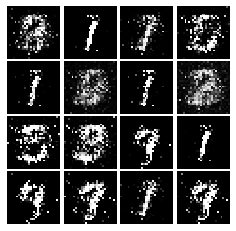

Epoch: 2, Iter: 1320, D: 0.1705, G:0.2873


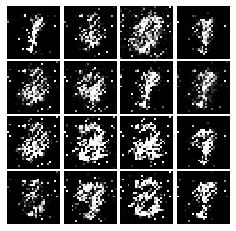

Epoch: 2, Iter: 1340, D: 0.1579, G:0.2514


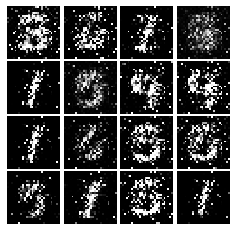

Epoch: 2, Iter: 1360, D: 0.1226, G:0.3795


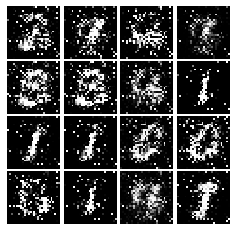

Epoch: 2, Iter: 1380, D: 0.1424, G:0.271


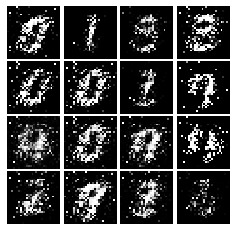

Epoch: 2, Iter: 1400, D: 0.1202, G:0.3381


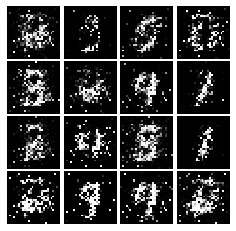

Epoch: 3, Iter: 1420, D: 0.1821, G:0.3646


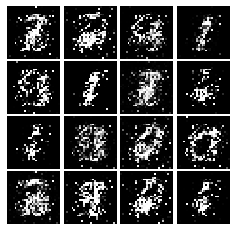

Epoch: 3, Iter: 1440, D: 0.1787, G:0.2806


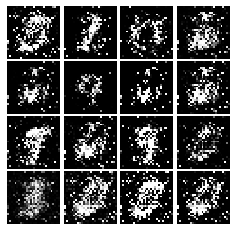

Epoch: 3, Iter: 1460, D: 0.1625, G:0.4013


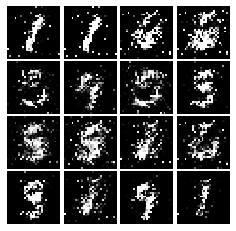

Epoch: 3, Iter: 1480, D: 0.1764, G:0.2707


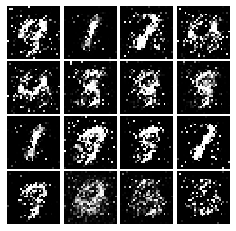

Epoch: 3, Iter: 1500, D: 0.1984, G:0.1694


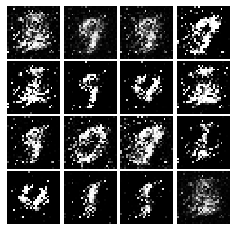

Epoch: 3, Iter: 1520, D: 0.171, G:0.2814


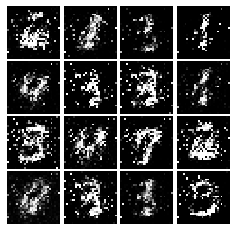

Epoch: 3, Iter: 1540, D: 0.1675, G:0.2629


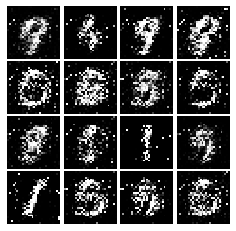

Epoch: 3, Iter: 1560, D: 0.249, G:0.1657


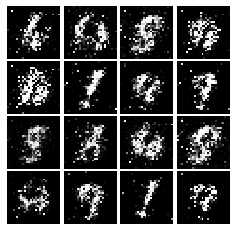

Epoch: 3, Iter: 1580, D: 0.1897, G:0.2102


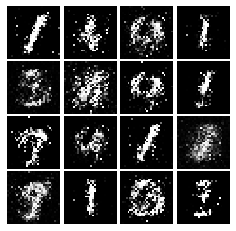

Epoch: 3, Iter: 1600, D: 0.2766, G:0.1866


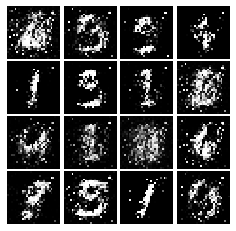

Epoch: 3, Iter: 1620, D: 0.1857, G:0.2621


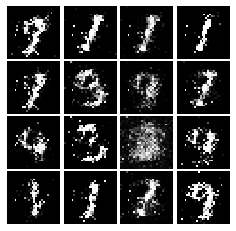

Epoch: 3, Iter: 1640, D: 0.1767, G:0.2247


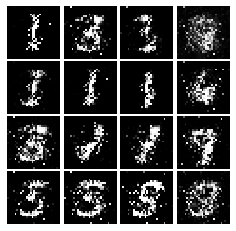

Epoch: 3, Iter: 1660, D: 0.1585, G:0.309


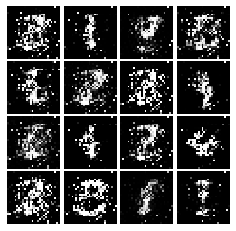

Epoch: 3, Iter: 1680, D: 0.1801, G:0.2343


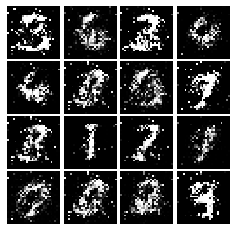

Epoch: 3, Iter: 1700, D: 0.2398, G:0.3085


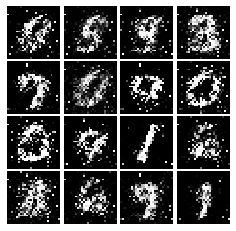

Epoch: 3, Iter: 1720, D: 0.196, G:0.2251


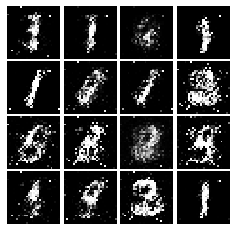

Epoch: 3, Iter: 1740, D: 0.1861, G:0.2698


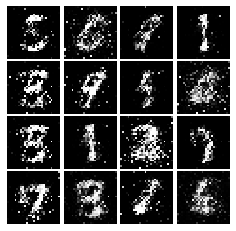

Epoch: 3, Iter: 1760, D: 0.2032, G:0.1883


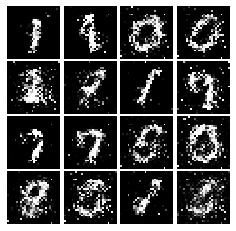

Epoch: 3, Iter: 1780, D: 0.2056, G:0.1582


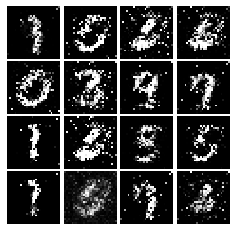

Epoch: 3, Iter: 1800, D: 0.1861, G:0.2102


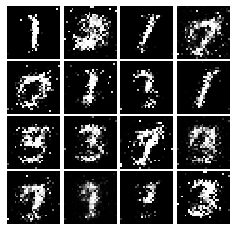

Epoch: 3, Iter: 1820, D: 0.1935, G:0.2917


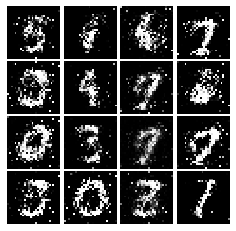

Epoch: 3, Iter: 1840, D: 0.2189, G:0.3375


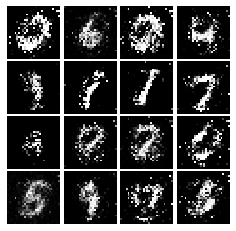

Epoch: 3, Iter: 1860, D: 0.2165, G:0.2069


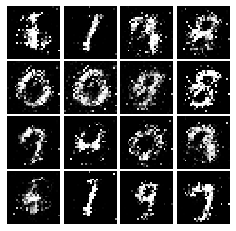

Epoch: 4, Iter: 1880, D: 0.1644, G:0.2536


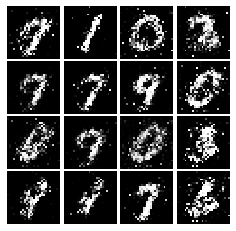

Epoch: 4, Iter: 1900, D: 0.2222, G:0.2111


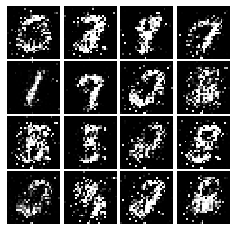

Epoch: 4, Iter: 1920, D: 0.1998, G:0.2059


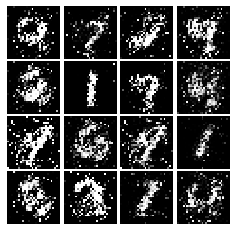

Epoch: 4, Iter: 1940, D: 0.2354, G:0.1826


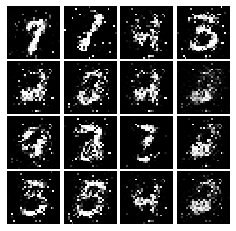

Epoch: 4, Iter: 1960, D: 0.2052, G:0.1962


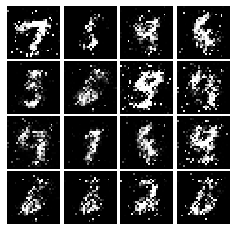

Epoch: 4, Iter: 1980, D: 0.1919, G:0.1938


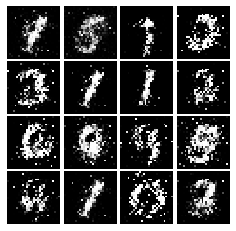

Epoch: 4, Iter: 2000, D: 0.2374, G:0.1919


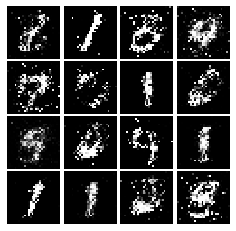

Epoch: 4, Iter: 2020, D: 0.2248, G:0.1877


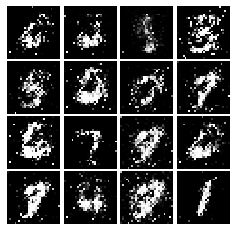

Epoch: 4, Iter: 2040, D: 0.2112, G:0.2259


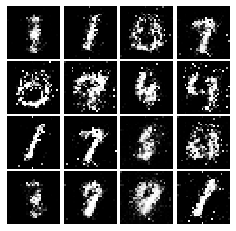

Epoch: 4, Iter: 2060, D: 0.2132, G:0.252


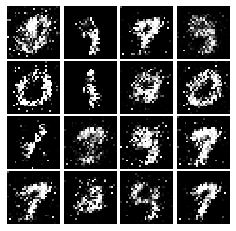

Epoch: 4, Iter: 2080, D: 0.2039, G:0.2238


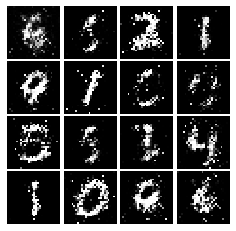

Epoch: 4, Iter: 2100, D: 0.203, G:0.1912


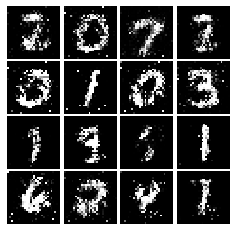

Epoch: 4, Iter: 2120, D: 0.1939, G:0.239


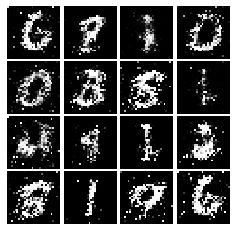

Epoch: 4, Iter: 2140, D: 0.2184, G:0.2137


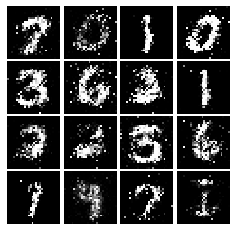

Epoch: 4, Iter: 2160, D: 0.2336, G:0.2015


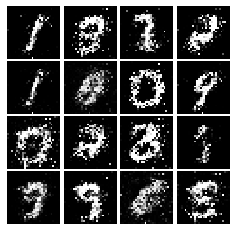

Epoch: 4, Iter: 2180, D: 0.211, G:0.186


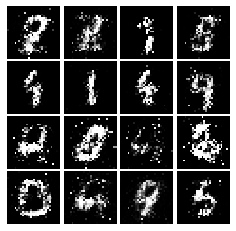

Epoch: 4, Iter: 2200, D: 0.1814, G:0.2127


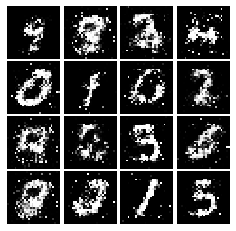

Epoch: 4, Iter: 2220, D: 0.1906, G:0.2274


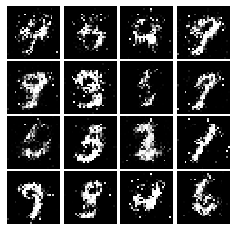

Epoch: 4, Iter: 2240, D: 0.2062, G:0.2169


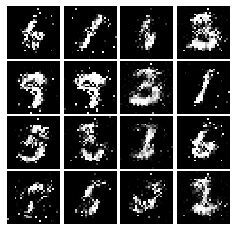

Epoch: 4, Iter: 2260, D: 0.2134, G:0.2368


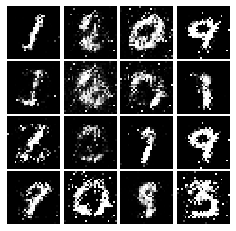

Epoch: 4, Iter: 2280, D: 0.2118, G:0.2504


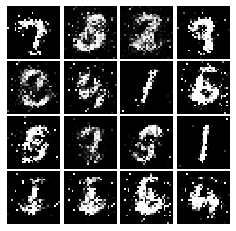

Epoch: 4, Iter: 2300, D: 0.196, G:0.1887


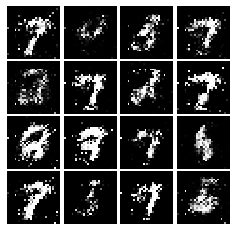

Epoch: 4, Iter: 2320, D: 0.2086, G:0.2349


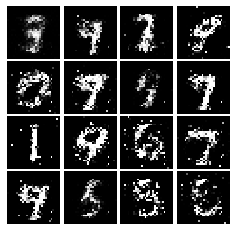

Epoch: 4, Iter: 2340, D: 0.1959, G:0.2386


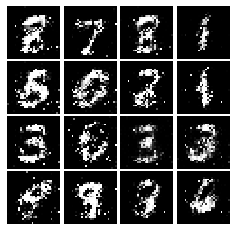

Epoch: 5, Iter: 2360, D: 0.1888, G:0.215


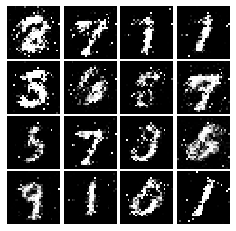

Epoch: 5, Iter: 2380, D: 0.1993, G:0.2089


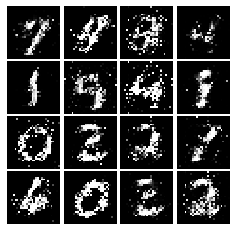

Epoch: 5, Iter: 2400, D: 0.1848, G:0.2752


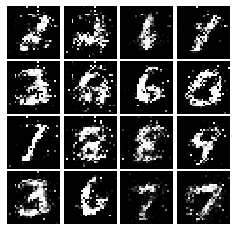

Epoch: 5, Iter: 2420, D: 0.2122, G:0.2207


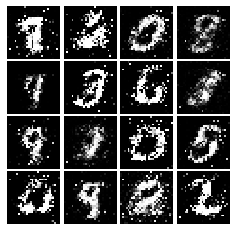

Epoch: 5, Iter: 2440, D: 0.2099, G:0.2525


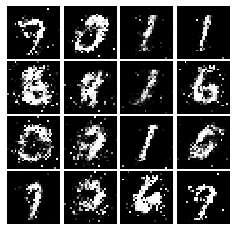

Epoch: 5, Iter: 2460, D: 0.1782, G:0.2552


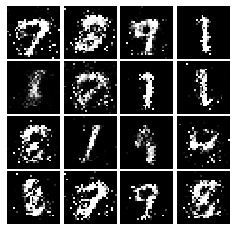

Epoch: 5, Iter: 2480, D: 0.2198, G:0.2369


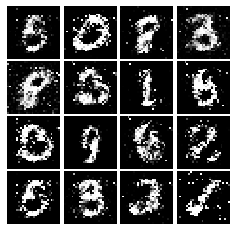

Epoch: 5, Iter: 2500, D: 0.1639, G:0.2863


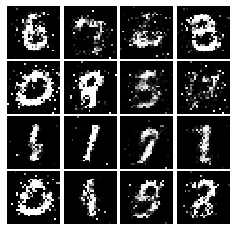

Epoch: 5, Iter: 2520, D: 0.2228, G:0.1926


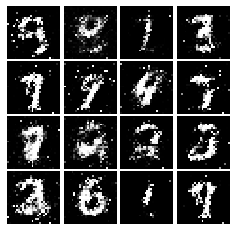

Epoch: 5, Iter: 2540, D: 0.2258, G:0.2097


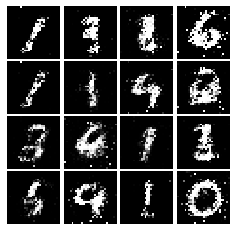

Epoch: 5, Iter: 2560, D: 0.2247, G:0.2136


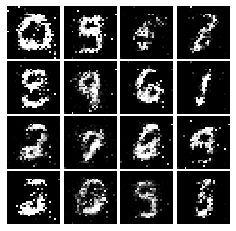

Epoch: 5, Iter: 2580, D: 0.2114, G:0.2124


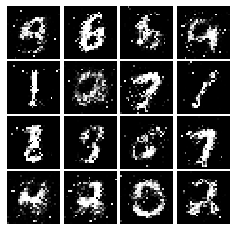

Epoch: 5, Iter: 2600, D: 0.2483, G:0.172


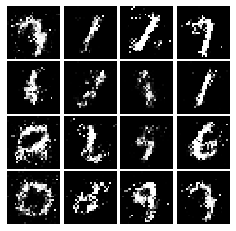

Epoch: 5, Iter: 2620, D: 0.217, G:0.2112


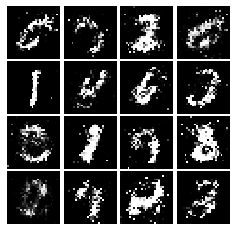

Epoch: 5, Iter: 2640, D: 0.21, G:0.1912


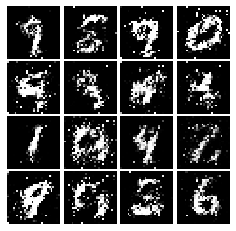

Epoch: 5, Iter: 2660, D: 0.2593, G:0.1673


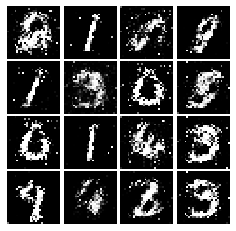

Epoch: 5, Iter: 2680, D: 0.2133, G:0.1868


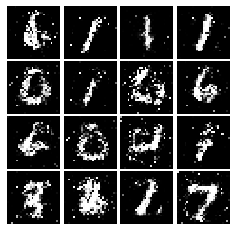

Epoch: 5, Iter: 2700, D: 0.2253, G:0.1729


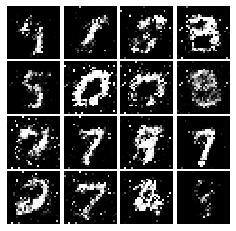

Epoch: 5, Iter: 2720, D: 0.2148, G:0.1762


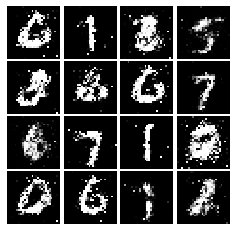

Epoch: 5, Iter: 2740, D: 0.2228, G:0.1789


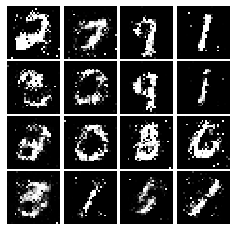

Epoch: 5, Iter: 2760, D: 0.2037, G:0.1617


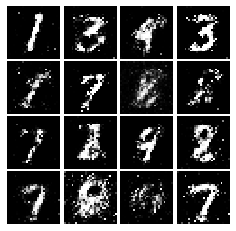

Epoch: 5, Iter: 2780, D: 0.2128, G:0.1996


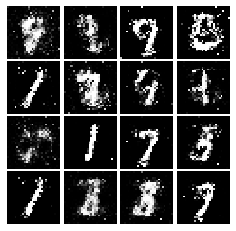

Epoch: 5, Iter: 2800, D: 0.1948, G:0.1848


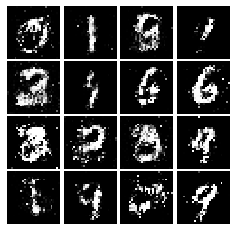

Epoch: 6, Iter: 2820, D: 0.2104, G:0.169


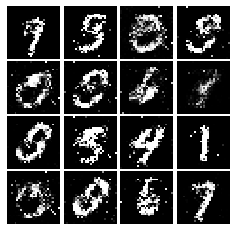

Epoch: 6, Iter: 2840, D: 0.2024, G:0.2057


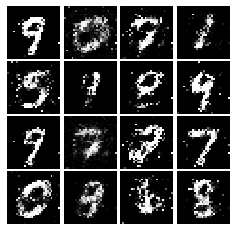

Epoch: 6, Iter: 2860, D: 0.2507, G:0.1601


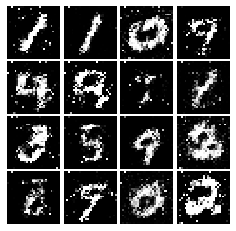

Epoch: 6, Iter: 2880, D: 0.2133, G:0.2086


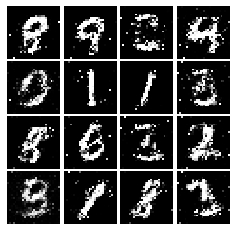

Epoch: 6, Iter: 2900, D: 0.25, G:0.1787


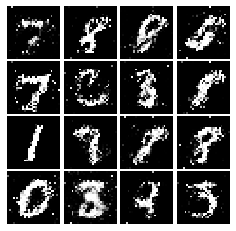

Epoch: 6, Iter: 2920, D: 0.2582, G:0.1886


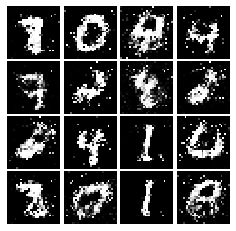

Epoch: 6, Iter: 2940, D: 0.1864, G:0.2042


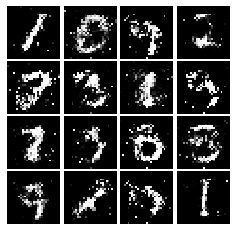

Epoch: 6, Iter: 2960, D: 0.2087, G:0.1688


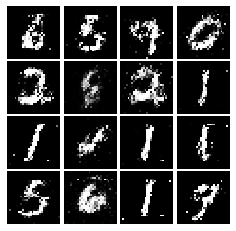

Epoch: 6, Iter: 2980, D: 0.2458, G:0.1676


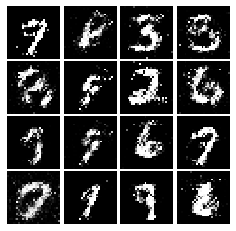

Epoch: 6, Iter: 3000, D: 0.2322, G:0.1525


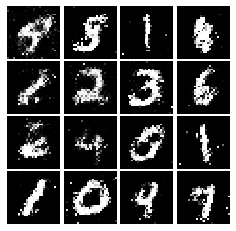

Epoch: 6, Iter: 3020, D: 0.2226, G:0.2074


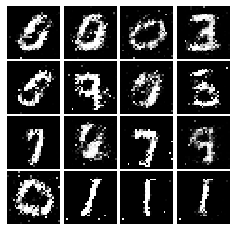

Epoch: 6, Iter: 3040, D: 0.2252, G:0.2226


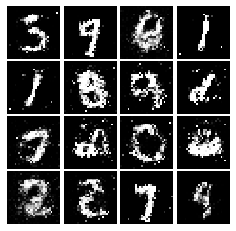

Epoch: 6, Iter: 3060, D: 0.2212, G:0.1738


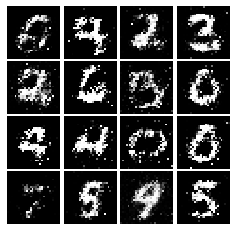

Epoch: 6, Iter: 3080, D: 0.2426, G:0.1839


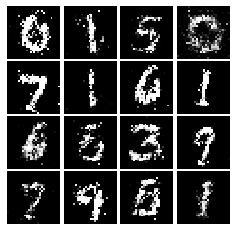

Epoch: 6, Iter: 3100, D: 0.1975, G:0.1825


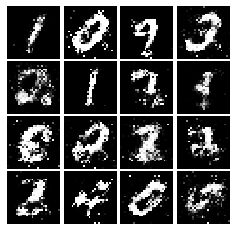

Epoch: 6, Iter: 3120, D: 0.2128, G:0.1664


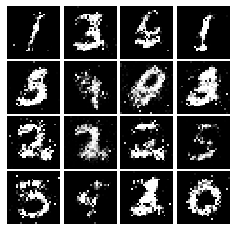

Epoch: 6, Iter: 3140, D: 0.2369, G:0.1787


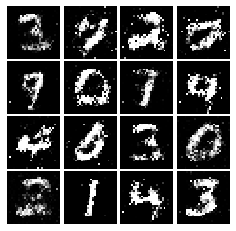

Epoch: 6, Iter: 3160, D: 0.2196, G:0.1636


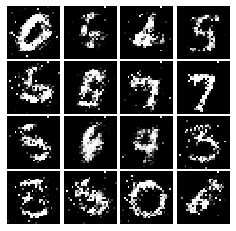

Epoch: 6, Iter: 3180, D: 0.217, G:0.171


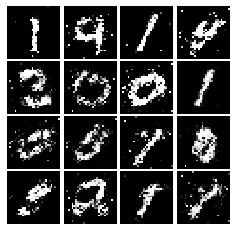

Epoch: 6, Iter: 3200, D: 0.2304, G:0.169


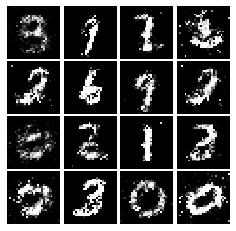

Epoch: 6, Iter: 3220, D: 0.1993, G:0.1964


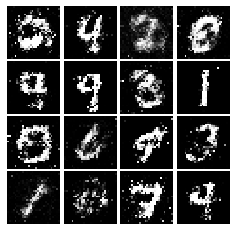

Epoch: 6, Iter: 3240, D: 0.2102, G:0.1702


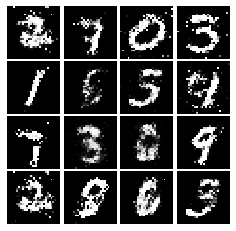

Epoch: 6, Iter: 3260, D: 0.2248, G:0.2056


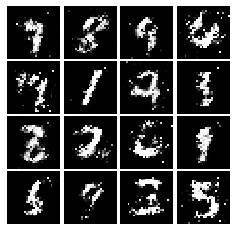

Epoch: 6, Iter: 3280, D: 0.2117, G:0.1947


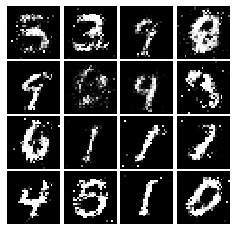

Epoch: 7, Iter: 3300, D: 0.2171, G:0.1599


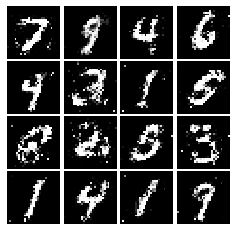

Epoch: 7, Iter: 3320, D: 0.2143, G:0.1749


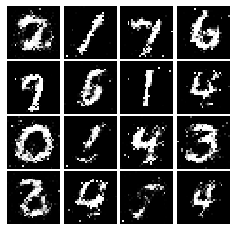

Epoch: 7, Iter: 3340, D: 0.2199, G:0.1947


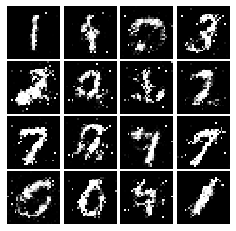

Epoch: 7, Iter: 3360, D: 0.2412, G:0.1818


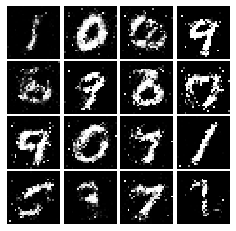

Epoch: 7, Iter: 3380, D: 0.2237, G:0.1553


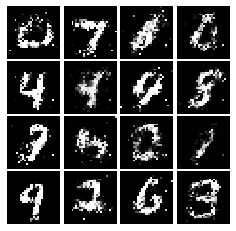

Epoch: 7, Iter: 3400, D: 0.2434, G:0.1679


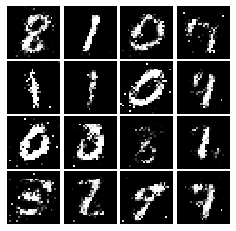

Epoch: 7, Iter: 3420, D: 0.2057, G:0.1998


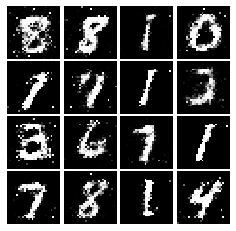

Epoch: 7, Iter: 3440, D: 0.2206, G:0.1848


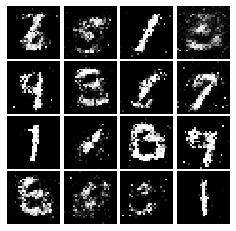

Epoch: 7, Iter: 3460, D: 0.2104, G:0.1674


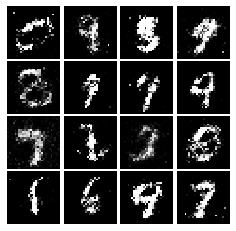

Epoch: 7, Iter: 3480, D: 0.2221, G:0.1704


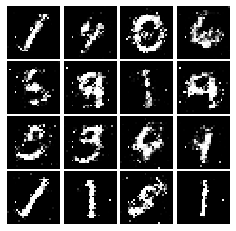

Epoch: 7, Iter: 3500, D: 0.2361, G:0.215


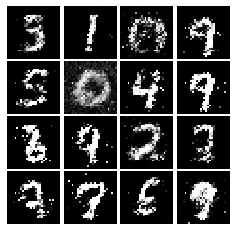

Epoch: 7, Iter: 3520, D: 0.2628, G:0.1696


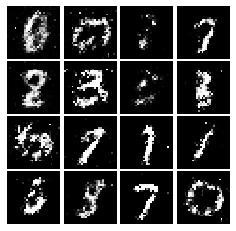

Epoch: 7, Iter: 3540, D: 0.2236, G:0.1942


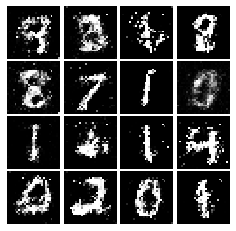

Epoch: 7, Iter: 3560, D: 0.223, G:0.1808


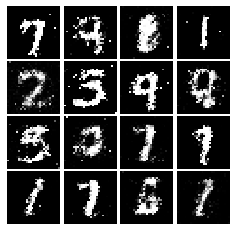

Epoch: 7, Iter: 3580, D: 0.2358, G:0.1928


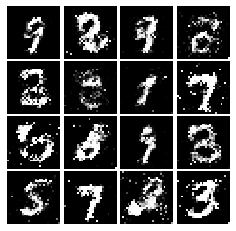

Epoch: 7, Iter: 3600, D: 0.2262, G:0.1947


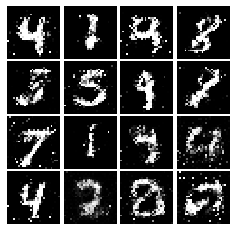

Epoch: 7, Iter: 3620, D: 0.2418, G:0.1595


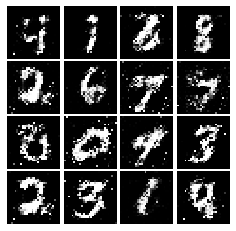

Epoch: 7, Iter: 3640, D: 0.2362, G:0.1717


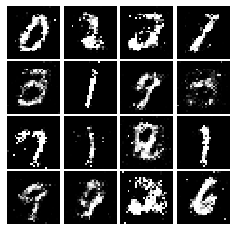

Epoch: 7, Iter: 3660, D: 0.2261, G:0.1862


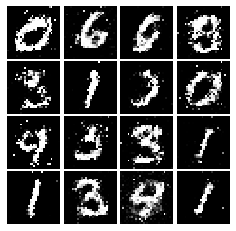

Epoch: 7, Iter: 3680, D: 0.2023, G:0.1558


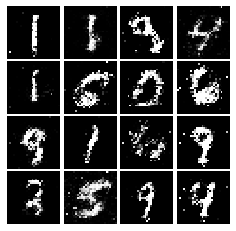

Epoch: 7, Iter: 3700, D: 0.2219, G:0.1716


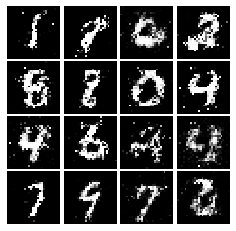

Epoch: 7, Iter: 3720, D: 0.236, G:0.1726


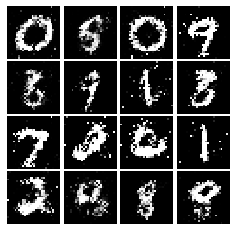

Epoch: 7, Iter: 3740, D: 0.2304, G:0.1559


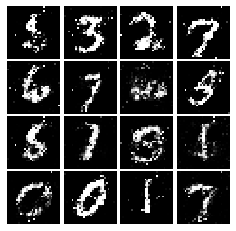

Epoch: 8, Iter: 3760, D: 0.2267, G:0.1837


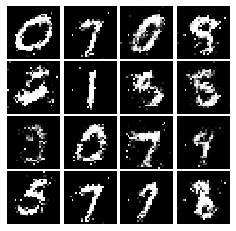

Epoch: 8, Iter: 3780, D: 0.2142, G:0.1675


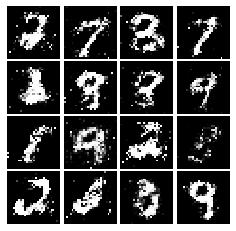

Epoch: 8, Iter: 3800, D: 0.2083, G:0.1835


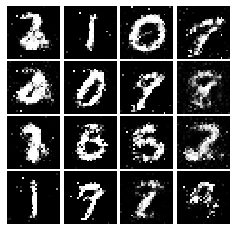

Epoch: 8, Iter: 3820, D: 0.2431, G:0.1662


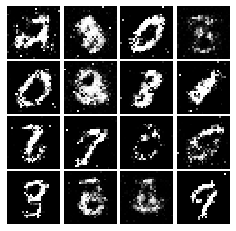

Epoch: 8, Iter: 3840, D: 0.2416, G:0.179


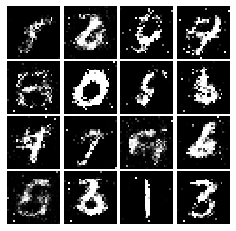

Epoch: 8, Iter: 3860, D: 0.2144, G:0.1637


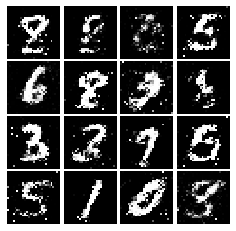

Epoch: 8, Iter: 3880, D: 0.2225, G:0.1938


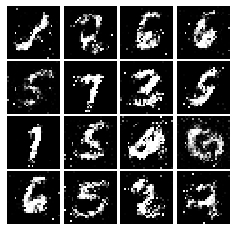

Epoch: 8, Iter: 3900, D: 0.2294, G:0.1777


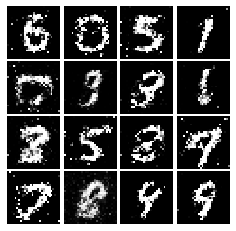

Epoch: 8, Iter: 3920, D: 0.202, G:0.1756


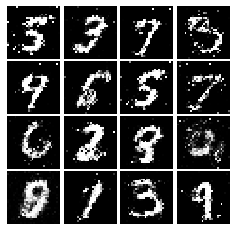

Epoch: 8, Iter: 3940, D: 0.2451, G:0.1564


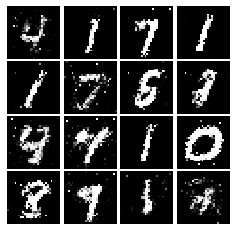

Epoch: 8, Iter: 3960, D: 0.2219, G:0.1724


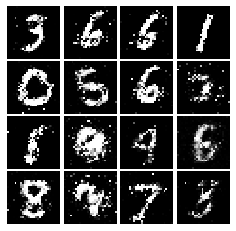

Epoch: 8, Iter: 3980, D: 0.22, G:0.1504


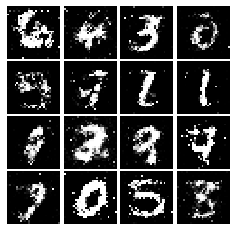

Epoch: 8, Iter: 4000, D: 0.2119, G:0.1981


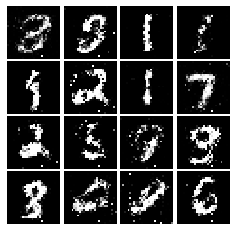

Epoch: 8, Iter: 4020, D: 0.2315, G:0.1472


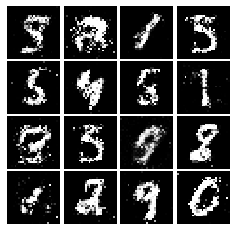

Epoch: 8, Iter: 4040, D: 0.2281, G:0.1754


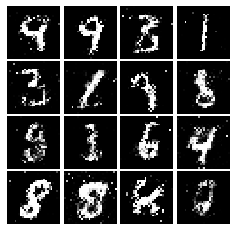

Epoch: 8, Iter: 4060, D: 0.2112, G:0.2122


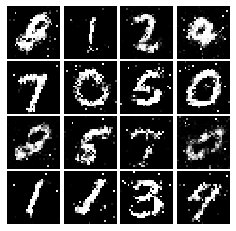

Epoch: 8, Iter: 4080, D: 0.2366, G:0.1461


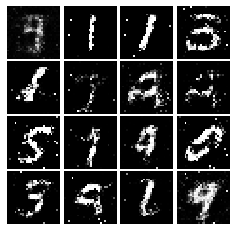

Epoch: 8, Iter: 4100, D: 0.2409, G:0.1757


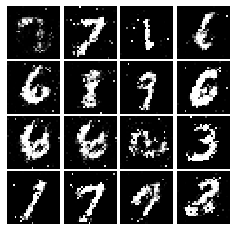

Epoch: 8, Iter: 4120, D: 0.2369, G:0.1824


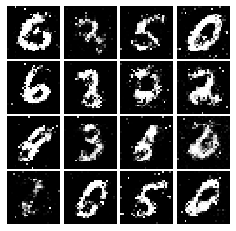

Epoch: 8, Iter: 4140, D: 0.2061, G:0.2077


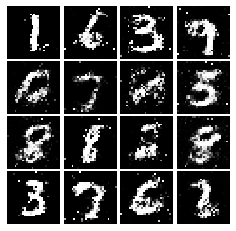

Epoch: 8, Iter: 4160, D: 0.2258, G:0.1687


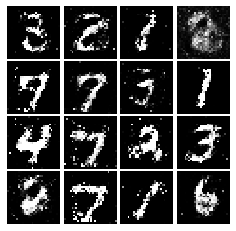

Epoch: 8, Iter: 4180, D: 0.2206, G:0.1809


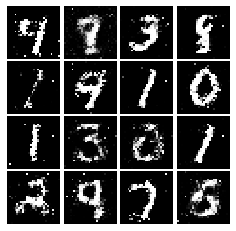

Epoch: 8, Iter: 4200, D: 0.2461, G:0.2207


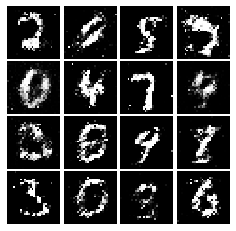

Epoch: 8, Iter: 4220, D: 0.2536, G:0.1869


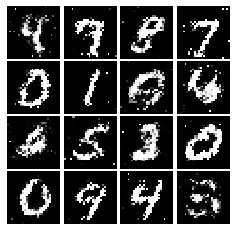

Epoch: 9, Iter: 4240, D: 0.2354, G:0.1499


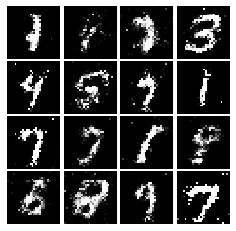

Epoch: 9, Iter: 4260, D: 0.2073, G:0.1683


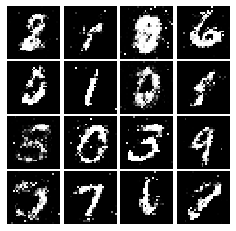

Epoch: 9, Iter: 4280, D: 0.2466, G:0.1584


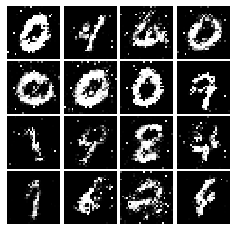

Epoch: 9, Iter: 4300, D: 0.2615, G:0.1688


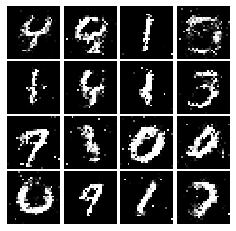

Epoch: 9, Iter: 4320, D: 0.2313, G:0.18


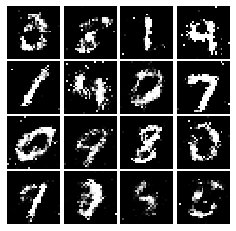

Epoch: 9, Iter: 4340, D: 0.2505, G:0.1713


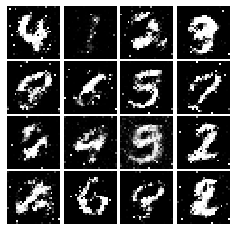

Epoch: 9, Iter: 4360, D: 0.2256, G:0.1657


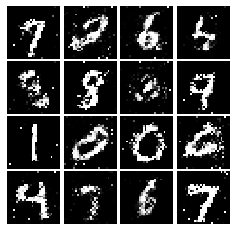

Epoch: 9, Iter: 4380, D: 0.2276, G:0.1527


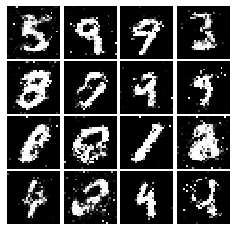

Epoch: 9, Iter: 4400, D: 0.2019, G:0.1782


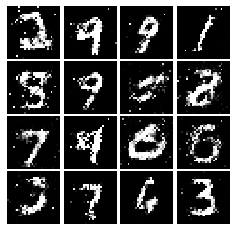

Epoch: 9, Iter: 4420, D: 0.2319, G:0.1673


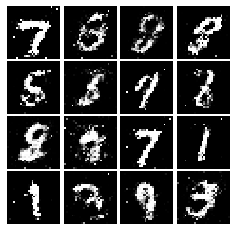

Epoch: 9, Iter: 4440, D: 0.2285, G:0.1418


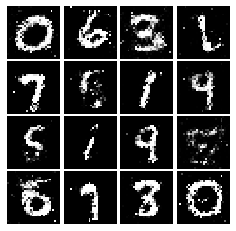

Epoch: 9, Iter: 4460, D: 0.2355, G:0.1547


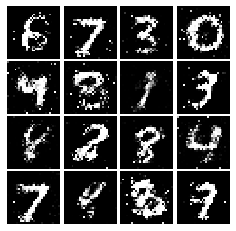

Epoch: 9, Iter: 4480, D: 0.2234, G:0.1557


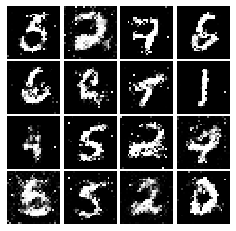

Epoch: 9, Iter: 4500, D: 0.2406, G:0.1575


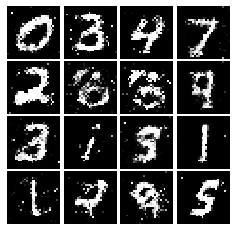

Epoch: 9, Iter: 4520, D: 0.2254, G:0.1803


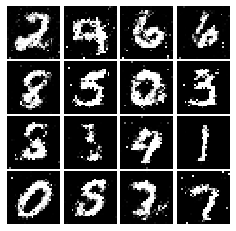

Epoch: 9, Iter: 4540, D: 0.2328, G:0.1548


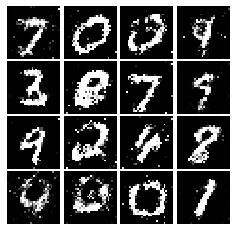

Epoch: 9, Iter: 4560, D: 0.2383, G:0.1672


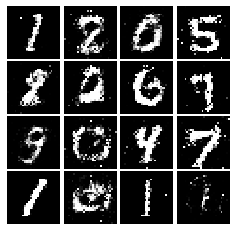

Epoch: 9, Iter: 4580, D: 0.2416, G:0.1677


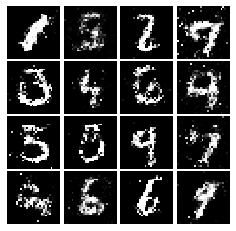

Epoch: 9, Iter: 4600, D: 0.2507, G:0.1707


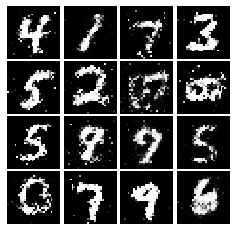

Epoch: 9, Iter: 4620, D: 0.2472, G:0.1477


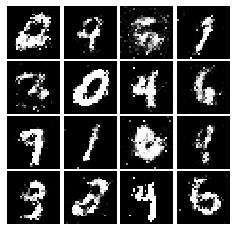

Epoch: 9, Iter: 4640, D: 0.2412, G:0.1867


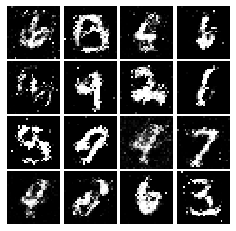

Epoch: 9, Iter: 4660, D: 0.235, G:0.156


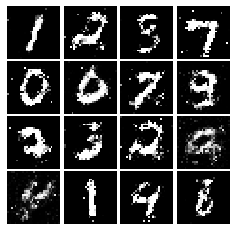

Epoch: 9, Iter: 4680, D: 0.2298, G:0.1578


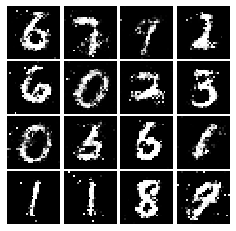

Final images


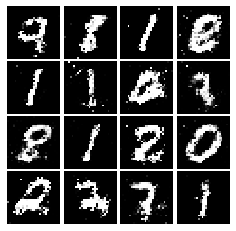

In [19]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [23]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Reshape((28,28,1),input_shape=(784,)),
        tf.keras.layers.Conv2D(32,kernel_size=5,strides=1,activation=leaky_relu),
        tf.keras.layers.MaxPooling2D(2),
        tf.keras.layers.Conv2D(64,kernel_size=5,strides=1,activation=leaky_relu),
        tf.keras.layers.MaxPooling2D(2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64,activation=leaky_relu),
        tf.keras.layers.Dense(1)
        

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [26]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    tf.keras.layers.Dense(1024,input_shape=(noise_dim,),activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128,activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((7,7,128)),
    tf.keras.layers.Conv2DTranspose(64,4,strides=2,activation='relu',padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(1,4,strides=2,activation='tanh',padding='same'),
    ])
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.453, G:0.6575


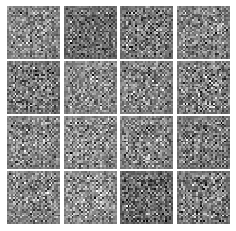

Epoch: 0, Iter: 20, D: 0.4962, G:1.096


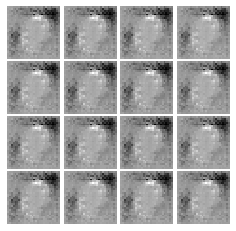

Epoch: 0, Iter: 40, D: 0.01872, G:4.183


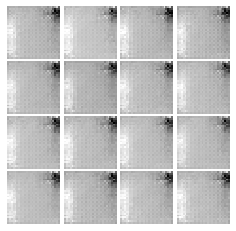

Epoch: 0, Iter: 60, D: 0.002674, G:5.994


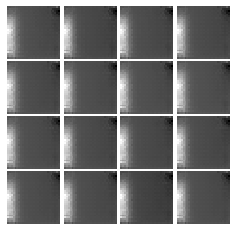

Epoch: 0, Iter: 80, D: 0.002, G:6.563


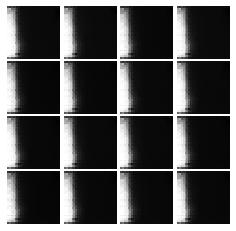

Epoch: 0, Iter: 100, D: 0.004688, G:8.392


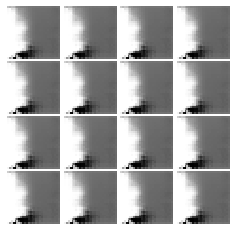

Epoch: 0, Iter: 120, D: 1.834, G:1.123


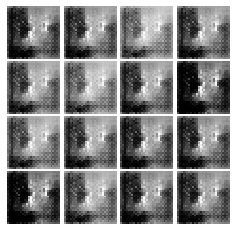

Epoch: 0, Iter: 140, D: 0.7482, G:0.9969


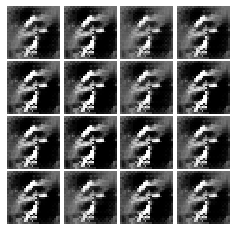

Epoch: 0, Iter: 160, D: 1.154, G:6.113


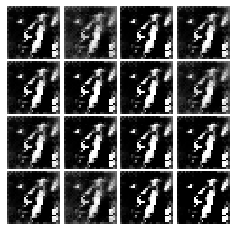

Epoch: 0, Iter: 180, D: 0.2957, G:5.799


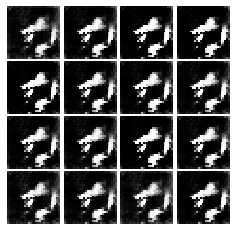

Epoch: 0, Iter: 200, D: 3.52, G:2.483


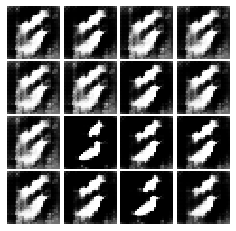

Epoch: 0, Iter: 220, D: 0.2839, G:3.442


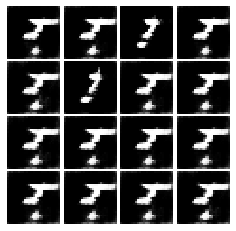

Epoch: 0, Iter: 240, D: 0.5034, G:2.086


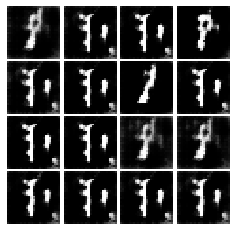

Epoch: 0, Iter: 260, D: 0.7878, G:2.654


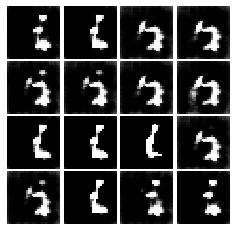

Epoch: 0, Iter: 280, D: 0.7885, G:2.463


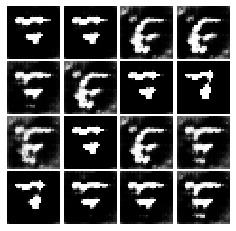

Epoch: 0, Iter: 300, D: 1.118, G:0.9678


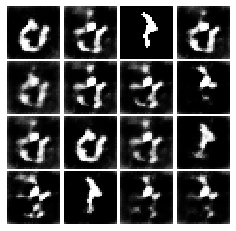

Epoch: 0, Iter: 320, D: 0.7889, G:1.725


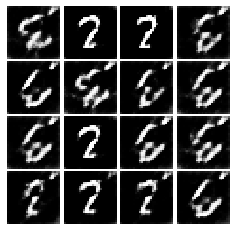

Epoch: 0, Iter: 340, D: 0.4968, G:2.286


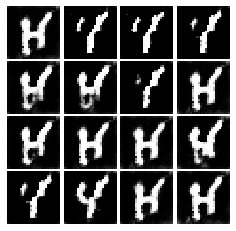

Epoch: 0, Iter: 360, D: 1.296, G:3.053


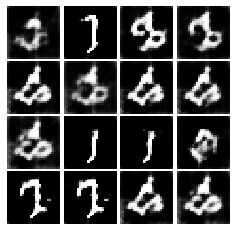

Epoch: 0, Iter: 380, D: 1.069, G:1.723


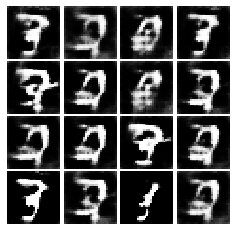

Epoch: 0, Iter: 400, D: 1.447, G:0.7815


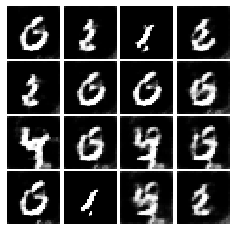

Epoch: 0, Iter: 420, D: 0.6906, G:1.491


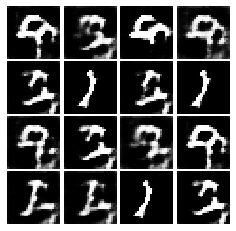

Epoch: 0, Iter: 440, D: 1.211, G:0.9014


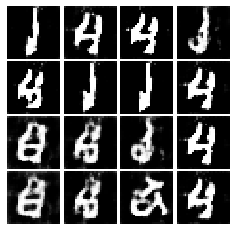

Epoch: 0, Iter: 460, D: 0.68, G:1.078


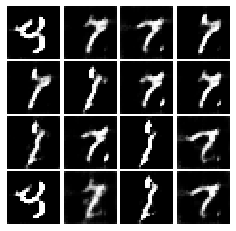

Epoch: 1, Iter: 480, D: 0.9119, G:1.888


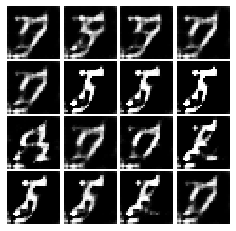

Epoch: 1, Iter: 500, D: 0.5882, G:2.53


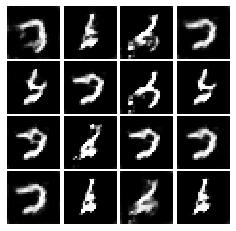

Epoch: 1, Iter: 520, D: 0.7733, G:1.926


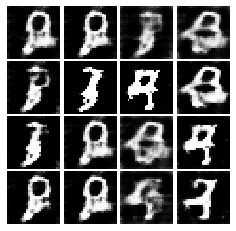

Epoch: 1, Iter: 540, D: 0.5413, G:2.081


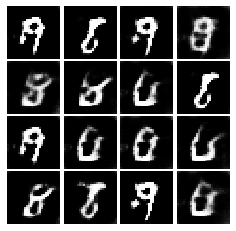

Epoch: 1, Iter: 560, D: 0.3821, G:3.337


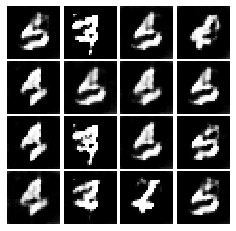

Epoch: 1, Iter: 580, D: 0.6751, G:3.243


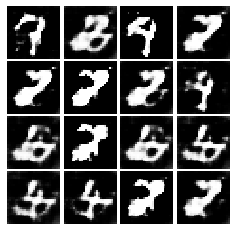

Epoch: 1, Iter: 600, D: 0.8779, G:0.7765


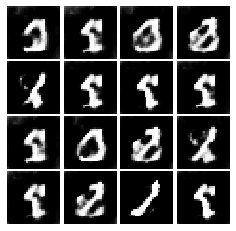

Epoch: 1, Iter: 620, D: 0.4918, G:1.914


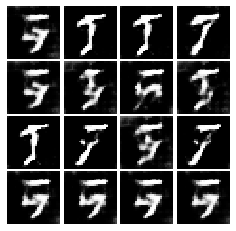

Epoch: 1, Iter: 640, D: 0.5739, G:2.096


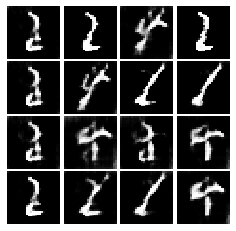

Epoch: 1, Iter: 660, D: 0.6242, G:2.51


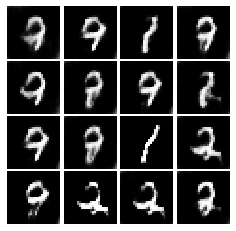

Epoch: 1, Iter: 680, D: 1.052, G:2.895


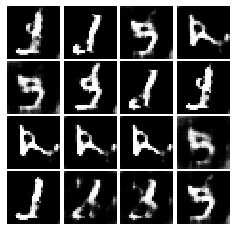

Epoch: 1, Iter: 700, D: 0.611, G:3.152


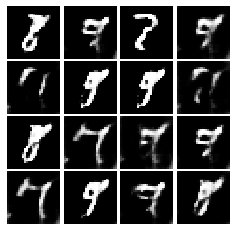

Epoch: 1, Iter: 720, D: 0.8997, G:4.165


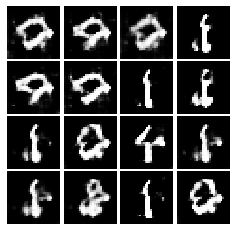

Epoch: 1, Iter: 740, D: 0.7798, G:1.751


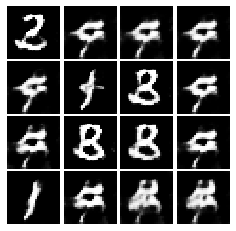

Epoch: 1, Iter: 760, D: 0.8351, G:2.065


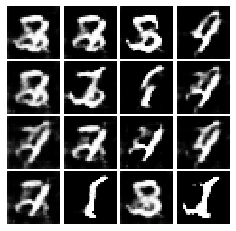

Epoch: 1, Iter: 780, D: 0.4242, G:2.581


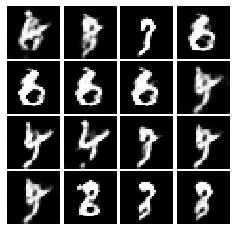

Epoch: 1, Iter: 800, D: 0.8491, G:1.639


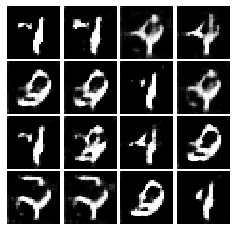

Epoch: 1, Iter: 820, D: 0.5239, G:2.516


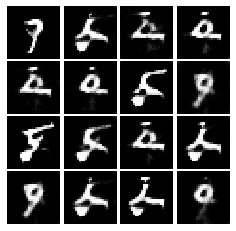

Epoch: 1, Iter: 840, D: 0.306, G:2.883


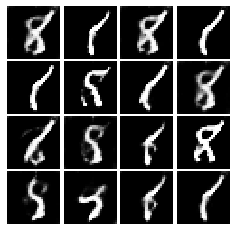

Epoch: 1, Iter: 860, D: 0.6839, G:1.97


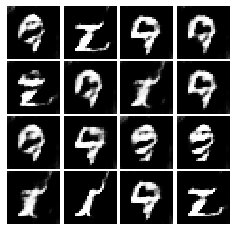

Epoch: 1, Iter: 880, D: 0.2504, G:3.505


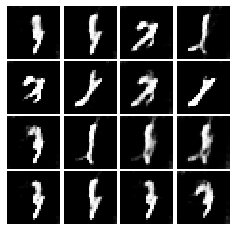

Epoch: 1, Iter: 900, D: 0.6521, G:3.735


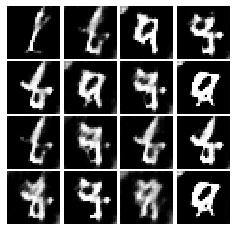

Epoch: 1, Iter: 920, D: 0.3707, G:3.464


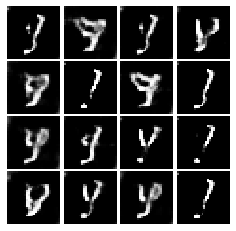

Epoch: 2, Iter: 940, D: 0.2572, G:3.367


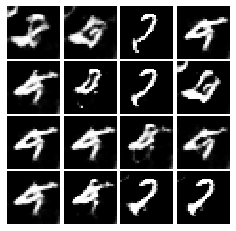

Epoch: 2, Iter: 960, D: 0.5451, G:2.961


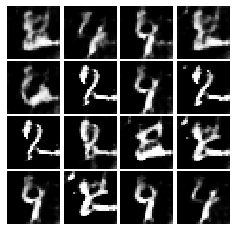

Epoch: 2, Iter: 980, D: 0.7514, G:2.797


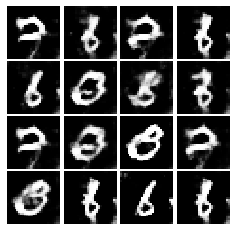

Epoch: 2, Iter: 1000, D: 0.7845, G:2.342


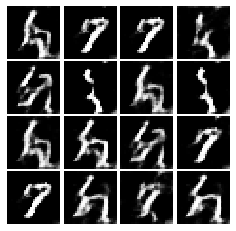

Epoch: 2, Iter: 1020, D: 0.3566, G:3.475


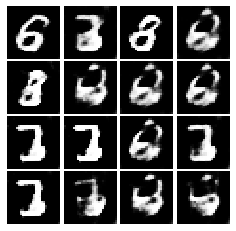

Epoch: 2, Iter: 1040, D: 0.6599, G:3.78


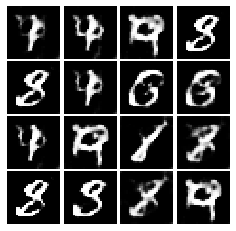

Epoch: 2, Iter: 1060, D: 0.6093, G:1.337


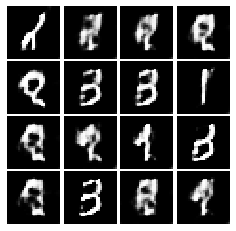

Epoch: 2, Iter: 1080, D: 0.6153, G:2.593


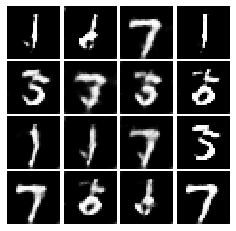

Epoch: 2, Iter: 1100, D: 0.3452, G:2.773


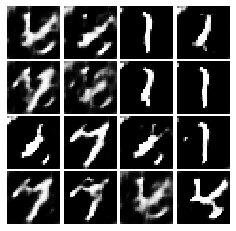

Epoch: 2, Iter: 1120, D: 0.5115, G:3.711


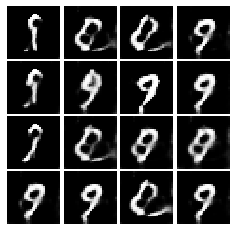

Epoch: 2, Iter: 1140, D: 0.3376, G:3.75


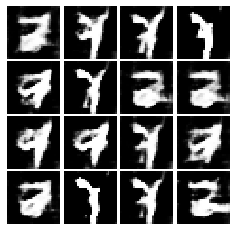

Epoch: 2, Iter: 1160, D: 0.7024, G:5.864


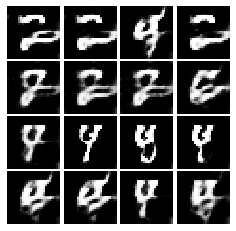

Epoch: 2, Iter: 1180, D: 0.3904, G:2.332


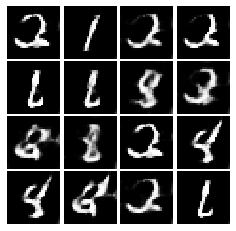

Epoch: 2, Iter: 1200, D: 0.3867, G:2.978


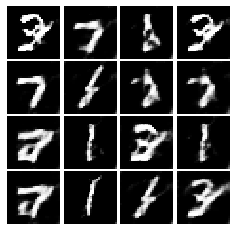

Epoch: 2, Iter: 1220, D: 1.265, G:5.232


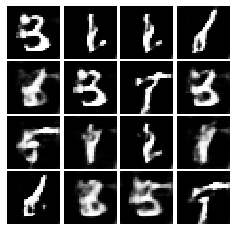

Epoch: 2, Iter: 1240, D: 0.6879, G:2.067


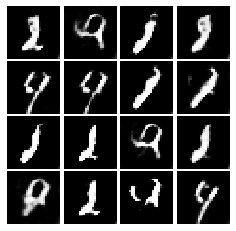

Epoch: 2, Iter: 1260, D: 0.7126, G:1.333


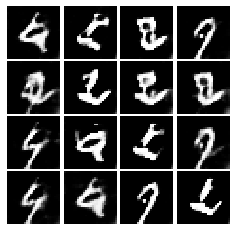

Epoch: 2, Iter: 1280, D: 0.5631, G:3.504


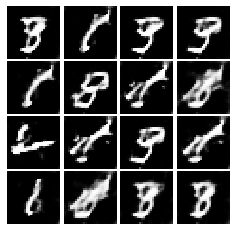

Epoch: 2, Iter: 1300, D: 0.4573, G:2.82


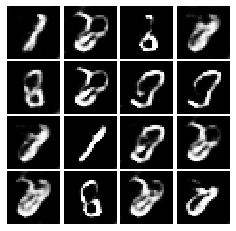

Epoch: 2, Iter: 1320, D: 0.702, G:3.087


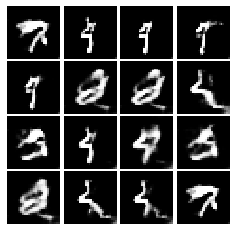

Epoch: 2, Iter: 1340, D: 1.127, G:6.108


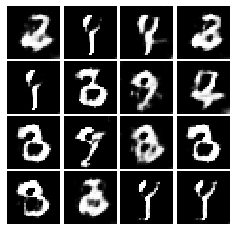

Epoch: 2, Iter: 1360, D: 0.5002, G:2.524


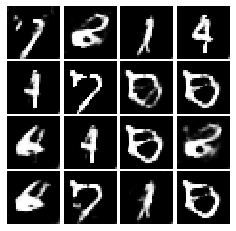

Epoch: 2, Iter: 1380, D: 0.4782, G:2.338


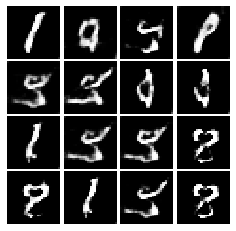

Epoch: 2, Iter: 1400, D: 0.5415, G:4.528


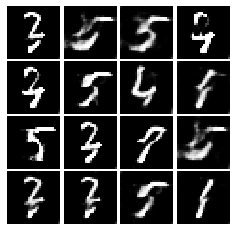

Epoch: 3, Iter: 1420, D: 0.9453, G:2.48


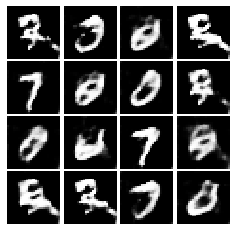

Epoch: 3, Iter: 1440, D: 1.419, G:2.896


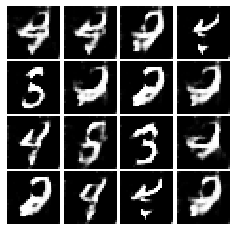

Epoch: 3, Iter: 1460, D: 0.7282, G:4.609


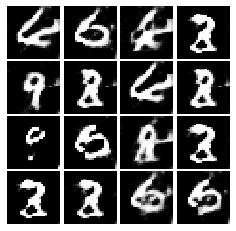

Epoch: 3, Iter: 1480, D: 0.8354, G:2.858


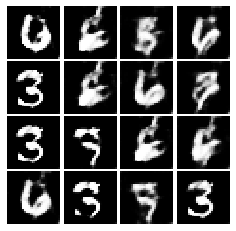

Epoch: 3, Iter: 1500, D: 0.6082, G:2.391


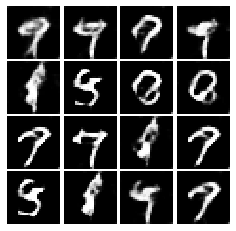

Epoch: 3, Iter: 1520, D: 0.4907, G:3.899


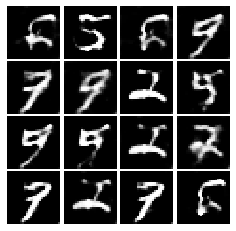

Epoch: 3, Iter: 1540, D: 0.5248, G:1.712


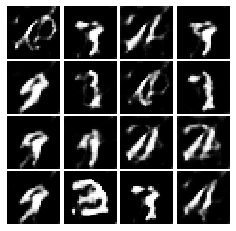

Epoch: 3, Iter: 1560, D: 0.4882, G:1.435


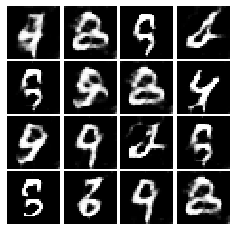

Epoch: 3, Iter: 1580, D: 0.3063, G:2.296


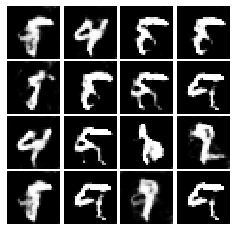

Epoch: 3, Iter: 1600, D: 0.404, G:4.566


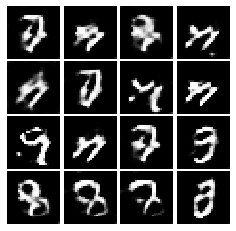

Epoch: 3, Iter: 1620, D: 0.3371, G:3.052


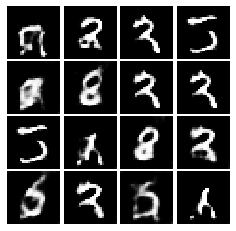

Epoch: 3, Iter: 1640, D: 0.5607, G:3.904


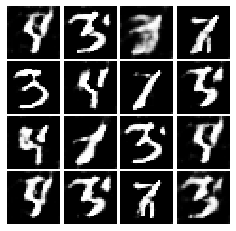

Epoch: 3, Iter: 1660, D: 0.4344, G:2.941


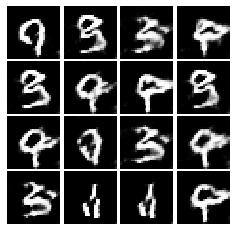

Epoch: 3, Iter: 1680, D: 0.5336, G:3.377


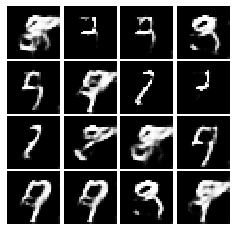

Epoch: 3, Iter: 1700, D: 0.4456, G:3.269


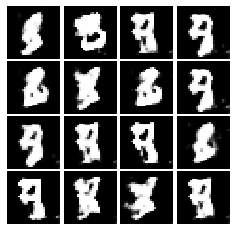

Epoch: 3, Iter: 1720, D: 0.2969, G:2.984


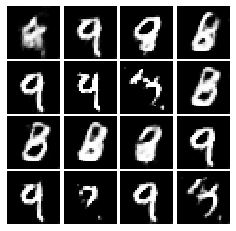

Epoch: 3, Iter: 1740, D: 0.241, G:4.052


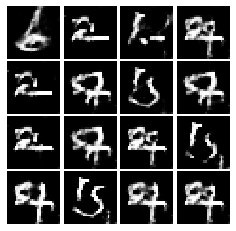

Epoch: 3, Iter: 1760, D: 0.2504, G:4.804


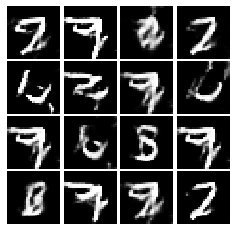

Epoch: 3, Iter: 1780, D: 0.5643, G:2.333


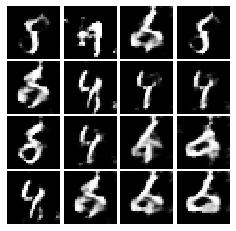

Epoch: 3, Iter: 1800, D: 0.4595, G:2.65


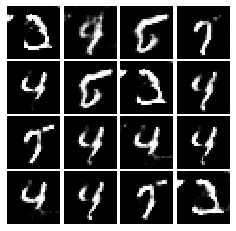

Epoch: 3, Iter: 1820, D: 0.4405, G:2.584


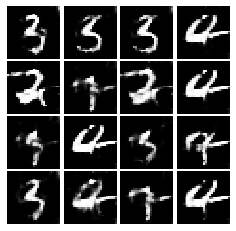

Epoch: 3, Iter: 1840, D: 0.4774, G:3.593


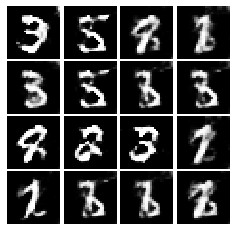

Epoch: 3, Iter: 1860, D: 0.3144, G:2.752


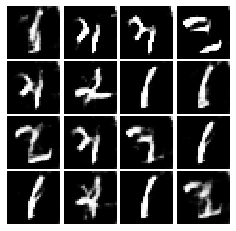

Epoch: 4, Iter: 1880, D: 0.2462, G:3.356


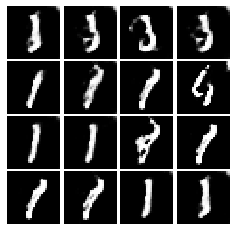

Epoch: 4, Iter: 1900, D: 0.3246, G:2.663


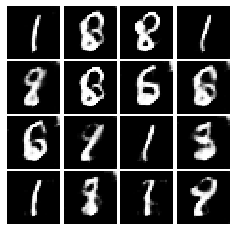

Epoch: 4, Iter: 1920, D: 0.4175, G:3.053


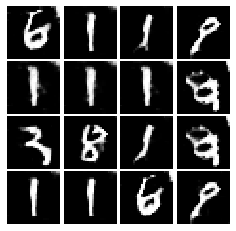

Epoch: 4, Iter: 1940, D: 0.3689, G:2.357


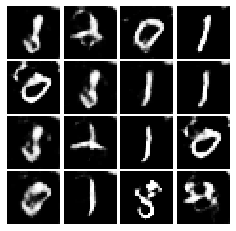

Epoch: 4, Iter: 1960, D: 0.5482, G:3.116


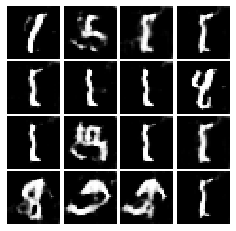

Epoch: 4, Iter: 1980, D: 0.5904, G:1.767


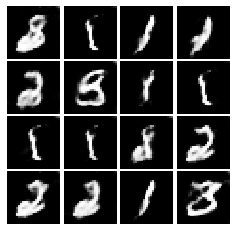

Epoch: 4, Iter: 2000, D: 0.8597, G:2.974


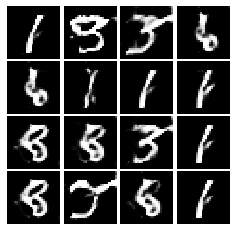

Epoch: 4, Iter: 2020, D: 0.3885, G:2.611


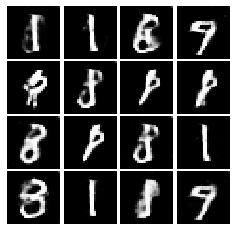

Epoch: 4, Iter: 2040, D: 0.5244, G:2.216


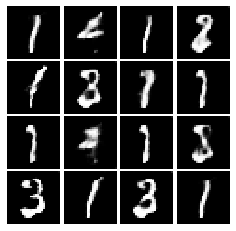

Epoch: 4, Iter: 2060, D: 0.3671, G:3.075


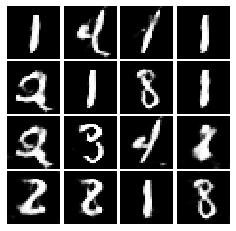

Epoch: 4, Iter: 2080, D: 0.5532, G:2.036


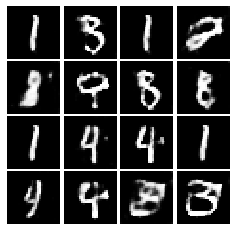

Epoch: 4, Iter: 2100, D: 0.4421, G:2.75


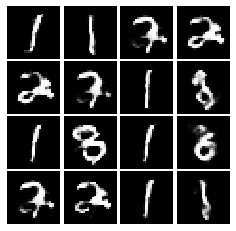

Epoch: 4, Iter: 2120, D: 0.4512, G:1.958


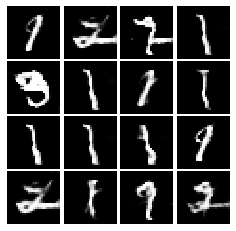

Epoch: 4, Iter: 2140, D: 0.7813, G:2.671


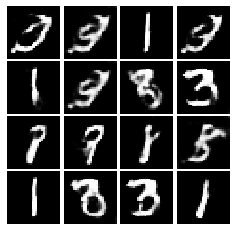

Epoch: 4, Iter: 2160, D: 0.4327, G:2.523


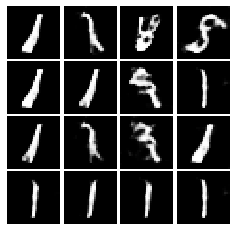

Epoch: 4, Iter: 2180, D: 0.4516, G:3.281


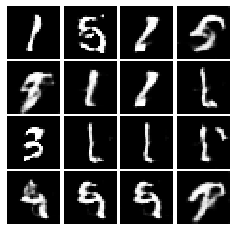

Epoch: 4, Iter: 2200, D: 0.4808, G:2.276


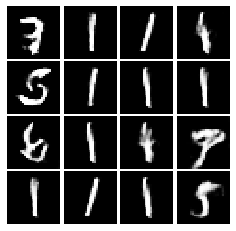

Epoch: 4, Iter: 2220, D: 0.3144, G:3.326


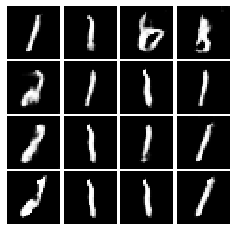

Epoch: 4, Iter: 2240, D: 0.6243, G:2.629


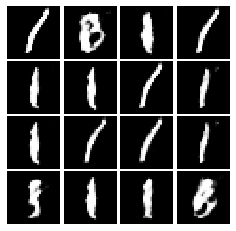

Epoch: 4, Iter: 2260, D: 0.3625, G:2.902


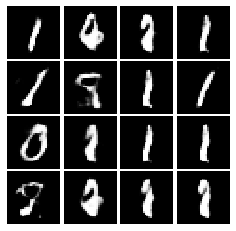

Epoch: 4, Iter: 2280, D: 0.4863, G:2.341


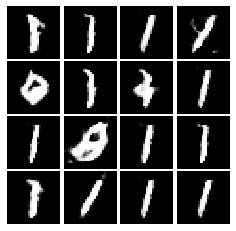

Epoch: 4, Iter: 2300, D: 0.528, G:2.424


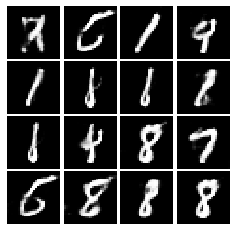

Epoch: 4, Iter: 2320, D: 0.361, G:2.389


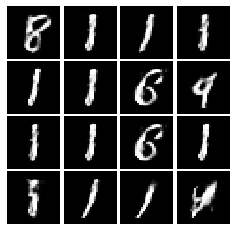

Epoch: 4, Iter: 2340, D: 0.6519, G:2.584


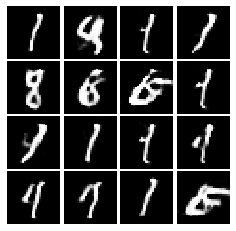

Final images


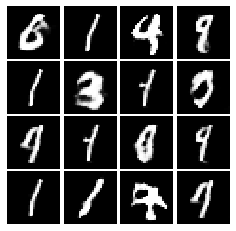

In [33]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
